> Notebook com o carregamento dos dados brutos, realização do pré-processamento e análise das variáveis com datas

---

#**Bibliotecas e instalações**

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

import pickle

In [2]:
from sklearn.preprocessing import LabelEncoder

# **Dicionário de variáveis**

*   **ESCOLARI**: Código para escolaridade do paciente (int = 1).

      1 – ANALFABETO

      2 – ENS. FUND. INCOMPLETO

      3 – ENS. FUND. COMPLETO

      4 – ENSINO MÉDIO

      5 – SUPERIOR

      9 – IGNORADA
*   **IDADE**: Idade do paciente (int = 3).
*   **SEXO**: Sexo do paciente (int = 1). 

      1 – MASCULINO

      2 – FEMININO
*   **UFNASC**: UF de nascimento (char = 2). Outras opções: SI - Sem informação; OP - Outro país.	
*   **UFRESID**: UF de residência (char = 2). Outras opções: OP - Outro país.
*   **IBGE**: Código da cidade de residência do paciente segundo IBGE com digito verificador (char = 7).
*   **CIDADE**: Cidade de residência do paciente (char = 200).
*   **CATEATEND**: Categoria de atendimento ao diagnóstico (int = 1). 

      1 - CONVENIO

      2 - SUS

      3 – PARTICULAR

      9 – SEM INFORMAÇÃO
*   **DTCONSULT**: Data da 1ª consulta (date = 10). Formato: DD/MM/YYYY	
*   **CLINICA**: Código da clinica (int = 2).

      1 – ALERGIA/IMUNOLOGIA

      2 – CIRURGIA CARDIACA

      3 – CIRURGIA CABEÇA E PESCOÇO

      4 – CIRURGIA GERAL

      5 – CIRURGIA PEDIATRICA

      6 – CIRURGIA PLASTICA

      7 – CIRURGIA TORAXICA

      8 – CIRURGIA VASCULAR

      9 – CLINICA MEDICA

      10 – DERMATOLOGIA

      11 – ENDOCRINOLOGIA

      12 – GASTROCIRURGIA
      
      13 – GASTROENTEROLOGIA
      
      14 – GERIATRIA
      
      15 – GINECOLOGIA
      
      16 – GINECOLOGIA / OBSTETRICIA
      
      17 – HEMATOLOGIA
      
      18 – INFECTOLOGIA
      
      19 – NEFROLOGIA
      
      20 – NEUROCIRURGIA
      
      21 – NEUROLOGIA
      
      22 – OFTALMOLOGIA
      
      23 – ONCOLOGIA CIRURGICA
      
      24 – ONCOLOGIA CLINICA
      
      25 – ONCOLOGIA PEDIATRICA
      
      26 – ORTOPEDIA
      
      27 – OTORRINOLARINGOLOGIA
      
      28 – PEDIATRIA
      
      29 – PNEUMOLOGIA
      
      30 – PROCTOLOGIA
      
      31 – RADIOTERAPIA
      
      32 – UROLOGIA
      
      33 – MASTOLOGIA
      
      34 – ONCOLOGIA CUTANEA
      
      35 – CIRURGIA PELVICA
      
      36 – CIRURGIA ABDOMINAL
      
      37 – ODONTOLOGIA
      
      38 – TRANSPLANTE HEPATICO
      
      99 – IGNORADO	
*   **DIAGPREV**: Diagnóstico e tratamento anterior (int = 1).

      1 – SEM DIAGNÓSTICO / SEM TRATAMENTO
      
      2 – COM DIAGNÓSTICO / SEM TRATAMENTO
      
      3 – COM DIAGNÓSTICO / COM TRATAMENTO
      
      4 – OUTROS	
*   **DTDIAG**: Data do diagnóstico (date = 10). Formato: DD/MM/YYYY	
*   **BASEDIAG**: Código da base do diagnóstico (int = 1).
      
      1 – EXAME CLINICO
      
      2 – RECURSOS AUXILIARES NÃO MICROSCÓPICOS
      
      3 – CONFIRMAÇÃO MICROSCÓPICA
      
      4 – SEM INFORMAÇÃO	
*   **TOPO**: Código da topografia (char = 4). Formato: C999 	
*   **TOPOGRUP**: Grupo da topografia	(char = 3). Formato: C99	
*   **DESCTOPO**: Descrição da Topografia (char = 80).
*   **MORFO**: Código da morfologia (char = 5). Formato: 99999
*   **DESCMORFO**: Descrição da morfologia (char = 80).
*   **EC**: Estádio clínico (char = 5).
*   **ECGRUP**: Grupo do estadiamento clínico (char = 3).

      0 - Tumores primários, classificados como in situ

      I - Tumores localizados

      II - Tumores com envolvimento regional por extensão direta

      III - Tumores com envolvimento regional de linfonodos
      
      IV - Tumores com metástase à distância 

      X - Para tumores não avaliados pelo profissional responsável ou sem informação sobre estadiamento anotada no prontuário

      Y - Para tumores em que não se aplica a classificação TNM. São os tumores não sólidos (por exemplo, as leucemias)
*   **T**: Classificação TNM - T (char = 5).
*   **N**: Classificação TNM - N (char = 5).	
*   **M**: Classificação TNM - M (char = 3).	
*   **PT**: Estadiamento pós cirúrgico (char = 5).
*   **PN**: Estadiamento pós cirúrgico (char = 5).	
*   **PM**: Estadiamento pós cirúrgico (char = 3).	
*   **S**: Classificação TNM - S (int = 1). Domínio: 0; 1; 2; 3; 8 – NÃO SE APLICA; 9 – X
*   **G**: Classificação TNM – G (Grau) (char = 5). 

      Domínio (exceto C40, C41, C381, C382, C383, C47, C48 e C49):
      0; 1; 2; 3; 4; 8 – NÃO SE APLICA; 9 – X

      Domínio (somente C40, C41, C381, C382, C383, C47, C48 e C49):
      ALTO; BAIXO; 8 – NÃO SE APLICA; 9 – X
	
*   **LOCALTNM**: Classificação TNM - Localização (int = 1).
      
      1 – SUPERIOR
      
      2 – MEDIO
      
      3 – INFERIOR
      
      8 – NÃO SE APLICA
      
      9 – X	
*   **IDMITOTIC**: Classificação TNM – Índice Mitótico (int = 1).
      
      1 – ALTA
      
      2 – BAIXA
      
      8 – NÃO SE APLICA
      
      9 – X	
*   **PSA**: Classificação TNM - PSA (int = 1).
      
      1 – MENOR QUE 10
      
      2 – MAIOR OU IGUAL A 10 E MENOR QUE 20
      
      3 – MAIOR OU IGUAL A 20
      
      8 – NÃO SE APLICA
      
      9 – X	
*   **GLEASON**: Classificação TNM - Gleason (int = 1).
      
      1 – MENOR OU IGUAL A 6
      
      2 – IGUAL A 7
      
      3 – MAIOR OU IGUAL A 8
      
      8 – NÃO SE APLICA
      
      9 – X	
*   **OUTRACLA**: Outra classificação de estadiamento (char = 20).
*   **META01**: Metástase (char = 3).	Formato: C99
*   **META02**: Metástase (char = 3).	Formato: C99
*   **META03**: Metástase (char = 3).	Formato: C99
*   **META04**: Metástase (char = 3).	Formato: C99
*   **DTTRAT**: Data de inicio do tratamento (date = 10). Formato: DD/MM/YYYY	
*   **NAOTRAT**: Código da razão para não realização do tratamento (int = 1).
      
      1 – RECUSA DO TRATAMENTO
      
      2 – DOENÇA AVANÇADA, FALTA DE CONDIÇÕES CLINICAS
      
      3 – OUTRAS DOENÇAS ASSOCIADAS
      
      4 – ABANDONO DE TRATAMENTO
      
      5 – OBITO POR CANCER
      
      6 – OBITO POR OUTRAS CAUSAS, SOE
      
      7 – OUTRAS
      
      8 – NÃO SE APLICA (CASO TENHA TRATAMENTO)
      
      9 – SEM INFORMAÇÃO	
*   **TRATAMENTO**: Código de combinação dos tratamentos realizados (char = 1).
      
      A – Cirurgia
      
      B – Radioterapia
      
      C – Quimioterapia
      
      D – Cirurgia + Radioterapia
      
      E – Cirurgia + Quimioterapia
      
      F – Radioterapia + Quimioterapia
      
      G – Cirurgia + Radio + Quimio
      
      H – Cirurgia + Radio + Quimio + Hormonio
      
      I – Outras combinações de tratamento
      
      J – Nenhum tratamento realizado	
*   **TRATHOSP**: Código de combinação dos tratamentos realizados no hospital (char = 1).
      
      A – Cirurgia
      
      B – Radioterapia
      
      C – Quimioterapia
      
      D – Cirurgia + Radioterapia
      
      E – Cirurgia + Quimioterapia
      
      F – Radioterapia + Quimioterapia
      
      G – Cirurgia + Radio + Quimio
      
      H – Cirurgia + Radio + Quimio + Hormonio
      
      I – Outras combinações de tratamento

      J – Nenhum tratamento realizado	
*   **TRATFANTES**: Código de combinação dos tratamentos realizados antes/durante admissão fora do hospital (char = 1).
      
      A – Cirurgia
      
      B – Radioterapia
      
      C – Quimioterapia
      
      D – Cirurgia + Radioterapia
      
      E – Cirurgia + Quimioterapia
      
      F – Radioterapia + Quimioterapia
      
      G – Cirurgia + Radio + Quimio
      
      H – Cirurgia + Radio + Quimio + Hormonio
      
      I – Outras combinações de tratamento
      
      J – Nenhum tratamento realizado
      
      K – Sem informação
*   **TRATFAPOS**: Código de combinação dos tratamentos realizados após admissão fora do hospital (char = 1).
      
      A – Cirurgia
      
      B – Radioterapia
      
      C – Quimioterapia
      
      D – Cirurgia + Radioterapia
      
      E – Cirurgia + Quimioterapia
      
      F – Radioterapia + Quimioterapia
      
      G – Cirurgia + Radio + Quimio
      
      H – Cirurgia + Radio + Quimio + Hormonio
      
      I – Outras combinações de tratamento
      
      J – Nenhum tratamento realizado
      
      K – Sem informação
*   **NENHUM**: Tratamento recebido no hospital = nenhum (int = 1). 0 – NÃO; 1 – SIM
*   **CIRURGIA**: Tratamento recebido no hospital = cirurgia (int = 1). 0 – NÃO; 1 – SIM
*   **RADIO**: Tratamento recebido no hospital = radioterapia (int = 1). 0 – NÃO; 1 – SIM
*   **QUIMIO**: Tratamento recebido no hospital = quimioterapia (int = 1). 0 – NÃO; 1 – SIM
*   **HORMONIO**: Tratamento recebido no hospital = hormonioterapia (int = 1). 0 – NÃO; 1 – SIM
*   **TMO**: Tratamento recebido no hospital = tmo (int = 1). 0 – NÃO; 1 – SIM
*   **IMUNO**: Tratamento recebido no hospital = imunoterapia (int = 1). 0 – NÃO; 1 – SIM
*   **OUTROS**: Tratamento recebido no hospital = outros (int = 1). 0 – NÃO; 1 – SIM
*   **NENHUMANT**: Tratamento recebido fora do hospital e antes da admissão = nenhum (int = 1). 0 – NÃO; 1 – SIM
*   **CIRURANT**: Tratamento recebido fora do hospital e antes da admissão = cirurgia (int = 1). 0 – NÃO; 1 – SIM
*   **RADIOANT**: Tratamento recebido fora do hospital e antes da admissão = radioterapia (int = 1). 0 – NÃO; 1 – SIM
*   **QUIMIOANT**: Tratamento recebido fora do hospital e antes da admissão = quimioterapia (int = 1). 0 – NÃO; 1 – SIM
*   **HORMOANT**: Tratamento recebido fora do hospital e antes da admissão = hormonioterapia (int = 1). 0 – NÃO; 1 – SIM
*   **TMOANT**: Tratamento recebido fora do hospital e antes da admissão = tmo (int = 1). 0 – NÃO; 1 – SIM
*   **IMUNOANT**: Tratamento recebido fora do hospital e antes da admissão = imunoterapia (int = 1). 0 – NÃO; 1 – SIM
*   **OUTROANT**: Tratamento recebido fora do hospital e antes da admissão = outros (int = 1). 0 – NÃO; 1 – SIM	
*   **NENHUMAPOS**: Tratamento recebido fora do hospital e durante/após admissão = nenhum	(int = 1). 0 – NÃO; 1 – SIM	
*   **CIRURAPOS**: Tratamento recebido fora do hospital e durante/após admissão = cirurgia	(int = 1). 0 – NÃO; 1 – SIM	
*   **RADIOAPOS**: Tratamento recebido fora do hospital e durante/após admissão = radioterapia	(int = 1). 0 – NÃO; 1 – SIM	
*   **QUIMIOAPOS**: Tratamento recebido fora do hospital e durante/após admissão = quimioterapia	(int = 1). 0 – NÃO; 1 – SIM		
*   **HORMOAPOS**: Tratamento recebido fora do hospital e durante/após admissão = hormonioterapia	(int = 1). 0 – NÃO; 1 – SIM		
*   **TMOAPOS**: Tratamento recebido fora do hospital e durante/após admissão = tmo	(int = 1). 0 – NÃO; 1 – SIM		
*   **IMUNOAPOS**: Tratamento recebido fora do hospital e durante/após admissão = imunoterapia	(int = 1). 0 – NÃO; 1 – SIM	
*   **OUTROAPOS**: Tratamento recebido fora do hospital e durante/após admissão = outros	(int = 1). 0 – NÃO; 1 – SIM	
*   **DTULTINFO**: Data da última informação do paciente (date = 10). Formato: DD/MM/YYYY
*   **ULTINFO**: Última informação sobre o paciente (int = 1).
      
      1 – VIVO, COM CÂNCER
      
      2 – VIVO, SOE
      
      3 – OBITO POR CANCER
      
      4 – OBITO POR OUTRAS CAUSAS, SOE
*   **CONSDIAG**: Diferença em dias entre as datas de consulta o diagnóstico (num = dias).
*   **TRATCONS**: Diferença em dias entre as datas de consulta e tratamento (num = dias).	
*   **DIAGTRAT**: Diferença em dias entre as datas de tratamento e diagnóstico (num = dias).
*   **ANODIAG**: Ano de diagnóstico (int = 4). Formato: 9999
*   **CICI**: Tumor infantil (char = 5).	
*   **CICIGRUP**: Tumor infantil – Grupo (char = 80).	
*   **CICISUBGRU**: Tumor infantil – Sub grupo (char = 80).	
*   **FAIXAETAR**: Faixa etária do paciente (char = 5).	
*   **LATERALI**: Lateralidade (int = 1).
      
      1 – DIREITA
      
      2 – ESQUERDA
      
      3 – BILATERAL
      
      8 - NÃO SE APLICA	
*   **INSTORIG**: Instituição de origem (char = 200). Obrigatório somente se DIAGPREV = 03 – COM DIAGNÓSTICO / COM TRATAMENTO
*   **DRS**: Departamentos Regionais de Saúde (char = 200).
*   **RRAS**: RRAS (char = 200).	
*   **PERDASEG**: Perda de seguimento (int = 1). 
      
      0 – Não
      
      1 – Sim
      
      8 – Não se aplica (excluído do cálculo para o indicador perda de seguimento)	
*   **ERRO**: Admissão com erro (int = 1). 0 – Sem; 1 – Com
*   **DTRECIDIVA**: Data da última ocorrência de recidiva (date = 10). Formato: DD/MM/YYYY	
*   **RECNENHUM**: Sem recidiva (int = 1). 0 - Não; 1 - Sim
*   **RECLOCAL**: Recidiva local (int = 1). 0 - Não; 1 - Sim	
*   **RECREGIO**: Recidiva regional (int = 1). 0 - Não; 1 - Sim	
*   **RECDIST**: Recidiva a distância / metástase (int = 1). 0 - Não; 1 - Sim	
*   **REC01**: Local da recidiva/metástase (char = 3). Formato: C99 
*   **REC02**: Local da recidiva/metástase (char = 3). Formato: C99 	
*   **REC03**: Local da recidiva/metástase (char = 3). Formato: C99 
*   **REC04**: Local da recidiva/metástase (char = 3). Formato: C99 	
*   **IBGEATEN**: Código IBGE da instituição (int = 7).	
*   **CIDO**: Código da morfologia 3ª Edição (int = 5). Formato: 99999	
*   **DSCCIDO**: Descrição da morfologia 3ª Edição (char = 89).




# **Leitura dos dados**

In [ ]:
data = pd.read_csv('/content/drive/MyDrive/Trabalho/Cancer/Datasets/pacigeral.csv', encoding='utf-8')

/usr/local/lib/python3.7/dist-packages/IPython/core/interactiveshell.py:2718: DtypeWarning:

Columns (23,24,25,32,36,78,91) have mixed types.Specify dtype option on import or set low_memory=False.



# **Pré-processamento**

Utilização dos dados que contenham as datas, além da utilização do LabelEncoder em divesas variáveis categóricas 



In [ ]:
df_aux = data.copy()
df_aux.shape

(943660, 95)

##**Datas**

*   **DTCONSULT**: Data da 1ª consulta (date = 10). Formato: DD/MM/YYYY	
*   **DTDIAG**: Data do diagnóstico (date = 10). Formato: DD/MM/YYYY
*   **DTTRAT**: Data de inicio do tratamento (date = 10). Formato: DD/MM/YYYY	
*   **DTULTINFO**: Data da última informação do paciente (date = 10). Formato: DD/MM/YYYY
*   **DTRECIDIVA**: Data da última ocorrência de recidiva (date = 10). Formato: DD/MM/YYYY

In [ ]:
# Data - DTCONSULT, DTDIAG, DTTRAT, DTULTINFO, DTRECIDIVA
dates = ['DTCONSULT', 'DTDIAG', 'DTTRAT', 'DTULTINFO', 'DTRECIDIVA']
df_aux[dates].isna().sum()

DTCONSULT          0
DTDIAG             0
DTTRAT         74896
DTULTINFO         45
DTRECIDIVA    848760
dtype: int64

In [ ]:
(df_aux[dates].isna().sum()/df_aux.shape[0])*100

DTCONSULT      0.000000
DTDIAG         0.000000
DTTRAT         7.936757
DTULTINFO      0.004769
DTRECIDIVA    89.943412
dtype: float64

In [ ]:
df_aux[dates].dtypes

DTCONSULT     object
DTDIAG        object
DTTRAT        object
DTULTINFO     object
DTRECIDIVA    object
dtype: object

In [ ]:
for c in dates:
  df_aux[c] = pd.to_datetime(df_aux[c])

df_aux[dates].dtypes

DTCONSULT     datetime64[ns]
DTDIAG        datetime64[ns]
DTTRAT        datetime64[ns]
DTULTINFO     datetime64[ns]
DTRECIDIVA    datetime64[ns]
dtype: object

##**Categorias numéricas**

*   **ESCOLARI**: Código para escolaridade do paciente (int = 1).

      1 – ANALFABETO

      2 – ENS. FUND. INCOMPLETO

      3 – ENS. FUND. COMPLETO

      4 – ENSINO MÉDIO

      5 – SUPERIOR

      9 – IGNORADA

In [ ]:
df_aux.ESCOLARI.value_counts()

2    303175
9    249236
3    142196
4    110885
1     71032
5     67136
Name: ESCOLARI, dtype: int64

*   **SEXO**: Sexo do paciente (int = 1). 

      1 – MASCULINO

      2 – FEMININO

In [ ]:
df_aux.SEXO.value_counts()

2    472175
1    471485
Name: SEXO, dtype: int64

*   **CATEATEND**: Categoria de atendimento ao diagnóstico (int = 1). 

      1 - CONVENIO

      2 - SUS

      3 – PARTICULAR

      9 – SEM INFORMAÇÃO

In [ ]:
df_aux.CATEATEND.value_counts()

2    448124
9    404512
1     80862
3     10162
Name: CATEATEND, dtype: int64

*   **CLINICA**: Código da clinica (int = 2).

      1 – ALERGIA/IMUNOLOGIA

      2 – CIRURGIA CARDIACA

      3 – CIRURGIA CABEÇA E PESCOÇO

      4 – CIRURGIA GERAL

      5 – CIRURGIA PEDIATRICA

      6 – CIRURGIA PLASTICA

      7 – CIRURGIA TORAXICA

      8 – CIRURGIA VASCULAR

      9 – CLINICA MEDICA

      10 – DERMATOLOGIA

      11 – ENDOCRINOLOGIA

      12 – GASTROCIRURGIA
      
      13 – GASTROENTEROLOGIA
      
      14 – GERIATRIA
      
      15 – GINECOLOGIA
      
      16 – GINECOLOGIA / OBSTETRICIA
      
      17 – HEMATOLOGIA
      
      18 – INFECTOLOGIA
      
      19 – NEFROLOGIA
      
      20 – NEUROCIRURGIA
      
      21 – NEUROLOGIA
      
      22 – OFTALMOLOGIA
      
      23 – ONCOLOGIA CIRURGICA
      
      24 – ONCOLOGIA CLINICA
      
      25 – ONCOLOGIA PEDIATRICA
      
      26 – ORTOPEDIA
      
      27 – OTORRINOLARINGOLOGIA
      
      28 – PEDIATRIA
      
      29 – PNEUMOLOGIA
      
      30 – PROCTOLOGIA
      
      31 – RADIOTERAPIA
      
      32 – UROLOGIA
      
      33 – MASTOLOGIA
      
      34 – ONCOLOGIA CUTANEA
      
      35 – CIRURGIA PELVICA
      
      36 – CIRURGIA ABDOMINAL
      
      37 – ODONTOLOGIA
      
      38 – TRANSPLANTE HEPATICO
      
      99 – IGNORADO

In [ ]:
np.sort(df_aux.CLINICA.unique()) #### 39

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34,
       35, 36, 37, 38, 39, 99])

*   **DIAGPREV**: Diagnóstico e tratamento anterior (int = 1).

      1 – SEM DIAGNÓSTICO / SEM TRATAMENTO
      
      2 – COM DIAGNÓSTICO / SEM TRATAMENTO
      
      3 – COM DIAGNÓSTICO / COM TRATAMENTO
      
      4 – OUTROS

In [ ]:
df_aux.DIAGPREV.value_counts()

1    593200
2    350460
Name: DIAGPREV, dtype: int64

*   **BASEDIAG**: Código da base do diagnóstico (int = 1).
      
      1 – EXAME CLINICO
      
      2 – RECURSOS AUXILIARES NÃO MICROSCÓPICOS
      
      3 – CONFIRMAÇÃO MICROSCÓPICA
      
      9 – SEM INFORMAÇÃO

In [ ]:
df_aux.BASEDIAG.value_counts()

3    927294
2     13320
1      2059
9       987
Name: BASEDIAG, dtype: int64

*   **S**: Classificação TNM - S (int = 1). Domínio: 0; 1; 2; 3; 8 – NÃO SE APLICA; 9 – X
*   **G**: Classificação TNM – G (Grau) (char = 5). 

      Domínio (exceto C40, C41, C381, C382, C383, C47, C48 e C49):
      0; 1; 2; 3; 4; 8 – NÃO SE APLICA; 9 – X

      Domínio (somente C40, C41, C381, C382, C383, C47, C48 e C49):
      ALTO; BAIXO; 8 – NÃO SE APLICA; 9 – X

In [ ]:
df_aux.S.value_counts() ### drop

8    943660
Name: S, dtype: int64

In [ ]:
df_aux.G.value_counts()

8    903222
9     12770
3     10600
2      8549
1      4720
4      3799
Name: G, dtype: int64

In [ ]:
# 8 - Não se aplica, 9 - X
df_aux.G[df_aux.G < 8].count()

27668

*   **LOCALTNM**: Classificação TNM - Localização (int = 1).
      
      1 – SUPERIOR
      
      2 – MEDIO
      
      3 – INFERIOR
      
      8 – NÃO SE APLICA
      
      9 – X	
*   **IDMITOTIC**: Classificação TNM – Índice Mitótico (int = 1).
      
      1 – ALTA
      
      2 – BAIXA
      
      8 – NÃO SE APLICA
      
      9 – X	

In [ ]:
df_aux.LOCALTNM.value_counts()

8    939049
2      2006
9      1384
1       625
3       596
Name: LOCALTNM, dtype: int64

In [ ]:
# 8 - Não se aplica, 9 - X
df_aux.LOCALTNM[df_aux.LOCALTNM < 8].count()

3227

In [ ]:
df_aux.IDMITOTIC.value_counts()

8    943155
2       267
1       151
9        87
Name: IDMITOTIC, dtype: int64

In [ ]:
# 8 - Não se aplica, 9 - X
df_aux.IDMITOTIC[df_aux.IDMITOTIC < 8].count()

418

*   **PSA**: Classificação TNM - PSA (int = 1).
      
      1 – MENOR QUE 10
      
      2 – MAIOR OU IGUAL A 10 E MENOR QUE 20
      
      3 – MAIOR OU IGUAL A 20
      
      8 – NÃO SE APLICA
      
      9 – X	
*   **GLEASON**: Classificação TNM - Gleason (int = 1).
      
      1 – MENOR OU IGUAL A 6
      
      2 – IGUAL A 7
      
      3 – MAIOR OU IGUAL A 8
      
      8 – NÃO SE APLICA
      
      9 – X	

In [ ]:
df_aux.PSA.value_counts()

8    911114
1     17698
2      6282
3      5362
9      3204
Name: PSA, dtype: int64

In [ ]:
# 8 - Não se aplica, 9 - X
df_aux.PSA[df_aux.PSA < 8].count()

29342

In [ ]:
df_aux.GLEASON.value_counts()

8    911114
2     13794
1     10079
3      6282
9      2391
Name: GLEASON, dtype: int64

In [ ]:
# 8 - Não se aplica, 9 - X
df_aux.GLEASON[df_aux.GLEASON < 8].count()

30155

*   **NAOTRAT**: Código da razão para não realização do tratamento (int = 1).
      
      1 – RECUSA DO TRATAMENTO
      
      2 – DOENÇA AVANÇADA, FALTA DE CONDIÇÕES CLINICAS
      
      3 – OUTRAS DOENÇAS ASSOCIADAS
      
      4 – ABANDONO DE TRATAMENTO
      
      5 – OBITO POR CANCER
      
      6 – OBITO POR OUTRAS CAUSAS, SOE
      
      7 – OUTRAS
      
      8 – NÃO SE APLICA (CASO TENHA TRATAMENTO)
      
      9 – SEM INFORMAÇÃO

In [ ]:
df_aux.NAOTRAT.value_counts()

8    868397
5     30655
7     20453
2      9166
9      7324
6      2474
3      1892
4      1718
1      1581
Name: NAOTRAT, dtype: int64

*   **NENHUM**: Tratamento recebido no hospital = nenhum (int = 1). 0 – NÃO; 1 – SIM
*   **CIRURGIA**: Tratamento recebido no hospital = cirurgia (int = 1). 0 – NÃO; 1 – SIM
*   **RADIO**: Tratamento recebido no hospital = radioterapia (int = 1). 0 – NÃO; 1 – SIM
*   **QUIMIO**: Tratamento recebido no hospital = quimioterapia (int = 1). 0 – NÃO; 1 – SIM
*   **HORMONIO**: Tratamento recebido no hospital = hormonioterapia (int = 1). 0 – NÃO; 1 – SIM
*   **TMO**: Tratamento recebido no hospital = tmo (int = 1). 0 – NÃO; 1 – SIM
*   **IMUNO**: Tratamento recebido no hospital = imunoterapia (int = 1). 0 – NÃO; 1 – SIM
*   **OUTROS**: Tratamento recebido no hospital = outros (int = 1). 0 – NÃO; 1 – SIM

In [ ]:
df_aux.NENHUM.unique()

array([0, 1])

In [ ]:
df_aux.CIRURGIA.unique()

array([1, 0])

In [ ]:
df_aux.RADIO.unique()

array([0, 1])

In [ ]:
df_aux.QUIMIO.unique()

array([0, 1])

In [ ]:
df_aux.HORMONIO.unique()

array([0, 1])

In [ ]:
df_aux.TMO.unique()

array([0, 1])

In [ ]:
df_aux.IMUNO.unique()

array([0, 1])

In [ ]:
df_aux.OUTROS.unique()

array([0, 1])

*   **NENHUMANT**: Tratamento recebido fora do hospital e antes da admissão = nenhum (int = 1). 0 – NÃO; 1 – SIM
*   **CIRURANT**: Tratamento recebido fora do hospital e antes da admissão = cirurgia (int = 1). 0 – NÃO; 1 – SIM
*   **RADIOANT**: Tratamento recebido fora do hospital e antes da admissão = radioterapia (int = 1). 0 – NÃO; 1 – SIM
*   **QUIMIOANT**: Tratamento recebido fora do hospital e antes da admissão = quimioterapia (int = 1). 0 – NÃO; 1 – SIM
*   **HORMOANT**: Tratamento recebido fora do hospital e antes da admissão = hormonioterapia (int = 1). 0 – NÃO; 1 – SIM
*   **TMOANT**: Tratamento recebido fora do hospital e antes da admissão = tmo (int = 1). 0 – NÃO; 1 – SIM
*   **IMUNOANT**: Tratamento recebido fora do hospital e antes da admissão = imunoterapia (int = 1). 0 – NÃO; 1 – SIM
*   **OUTROANT**: Tratamento recebido fora do hospital e antes da admissão = outros (int = 1). 0 – NÃO; 1 – SIM	

In [ ]:
df_aux.NENHUMANT.unique()

array([1, 0])

In [ ]:
df_aux.CIRURANT.unique()

array([0, 1])

In [ ]:
df_aux.RADIOANT.unique()

array([0, 1])

In [ ]:
df_aux.QUIMIOANT.unique() ### drop

array([0])

In [ ]:
df_aux.HORMOANT.unique() ### drop

array([0])

In [ ]:
df_aux.TMOANT.unique() ### drop

array([0])

In [ ]:
df_aux.IMUNOANT.unique() ### drop

array([0])

In [ ]:
df_aux.OUTROANT.unique() ### drop

array([0])

*   **NENHUMAPOS**: Tratamento recebido fora do hospital e durante/após admissão = nenhum	(int = 1). 0 – NÃO; 1 – SIM	
*   **CIRURAPOS**: Tratamento recebido fora do hospital e durante/após admissão = cirurgia	(int = 1). 0 – NÃO; 1 – SIM	
*   **RADIOAPOS**: Tratamento recebido fora do hospital e durante/após admissão = radioterapia	(int = 1). 0 – NÃO; 1 – SIM	
*   **QUIMIOAPOS**: Tratamento recebido fora do hospital e durante/após admissão = quimioterapia	(int = 1). 0 – NÃO; 1 – SIM		
*   **HORMOAPOS**: Tratamento recebido fora do hospital e durante/após admissão = hormonioterapia	(int = 1). 0 – NÃO; 1 – SIM		
*   **TMOAPOS**: Tratamento recebido fora do hospital e durante/após admissão = tmo	(int = 1). 0 – NÃO; 1 – SIM		
*   **IMUNOAPOS**: Tratamento recebido fora do hospital e durante/após admissão = imunoterapia	(int = 1). 0 – NÃO; 1 – SIM	
*   **OUTROAPOS**: Tratamento recebido fora do hospital e durante/após admissão = outros	(int = 1). 0 – NÃO; 1 – SIM	

In [ ]:
df_aux.NENHUMAPOS.unique()

array([1, 0])

In [ ]:
df_aux.CIRURAPOS.unique()

array([0, 1])

In [ ]:
df_aux.RADIOAPOS.unique()

array([0, 1])

In [ ]:
df_aux.QUIMIOAPOS.unique()

array([0, 1])

In [ ]:
df_aux.HORMOAPOS.unique()

array([0, 1])

In [ ]:
df_aux.TMOAPOS.unique()

array([0, 1])

In [ ]:
df_aux.IMUNOAPOS.unique()

array([0, 1])

In [ ]:
df_aux.OUTROAPOS.unique()

array([0, 1])

*   **ULTINFO**: Última informação sobre o paciente (int = 1).
      
      1 – VIVO, COM CÂNCER
      
      2 – VIVO, SOE
      
      3 – OBITO POR CANCER
      
      4 – OBITO POR OUTRAS CAUSAS, SOE

In [ ]:
df_aux.ULTINFO.value_counts()

2    435227
3    275159
4    123266
1    110008
Name: ULTINFO, dtype: int64

*   **LATERALI**: Lateralidade (int = 1).
      
      1 – DIREITA
      
      2 – ESQUERDA
      
      3 – BILATERAL
      
      8 - NÃO SE APLICA	

In [ ]:
df_aux.LATERALI.value_counts()

8    782219
1     81545
2     77560
3      2336
Name: LATERALI, dtype: int64

*   **PERDASEG**: Perda de seguimento (int = 1). 
      
      0 – Não
      
      1 – Sim
      
      8 – Não se aplica (excluído do cálculo para o indicador perda de seguimento)	

In [ ]:
df_aux.PERDASEG.value_counts()

0    779799
1    163861
Name: PERDASEG, dtype: int64

In [ ]:
df_aux[df_aux.PERDASEG == 1]['ULTINFO'].value_counts()

2    135234
1     28626
3         1
Name: ULTINFO, dtype: int64

*   **ERRO**: Admissão com erro (int = 1). 0 – Sem; 1 – Com
*   **RECNENHUM**: Sem recidiva (int = 1). 0 - Não; 1 - Sim
*   **RECLOCAL**: Recidiva local (int = 1). 0 - Não; 1 - Sim	
*   **RECREGIO**: Recidiva regional (int = 1). 0 - Não; 1 - Sim	
*   **RECDIST**: Recidiva a distância / metástase (int = 1). 0 - Não; 1 - Sim

In [ ]:
df_aux.ERRO.unique() ### drop

array([0])

In [ ]:
df_aux.RECNENHUM.value_counts()

1    865620
0     78040
Name: RECNENHUM, dtype: int64

In [ ]:
df_aux.RECLOCAL.value_counts()

0    905606
1     38054
Name: RECLOCAL, dtype: int64

In [ ]:
df_aux.RECREGIO.value_counts()

0    920649
1     23011
Name: RECREGIO, dtype: int64

In [ ]:
df_aux.RECDIST.value_counts()

0    922660
1     21000
Name: RECDIST, dtype: int64

## **Categorias com letras**

*   **TRATAMENTO**: Código de combinação dos tratamentos realizados (char = 1).
      
      A – Cirurgia
      
      B – Radioterapia
      
      C – Quimioterapia
      
      D – Cirurgia + Radioterapia
      
      E – Cirurgia + Quimioterapia
      
      F – Radioterapia + Quimioterapia
      
      G – Cirurgia + Radio + Quimio
      
      H – Cirurgia + Radio + Quimio + Hormonio
      
      I – Outras combinações de tratamento
      
      J – Nenhum tratamento realizado	
*   **TRATHOSP**: Código de combinação dos tratamentos realizados no hospital (char = 1).
      
      A – Cirurgia
      
      B – Radioterapia
      
      C – Quimioterapia
      
      D – Cirurgia + Radioterapia
      
      E – Cirurgia + Quimioterapia
      
      F – Radioterapia + Quimioterapia
      
      G – Cirurgia + Radio + Quimio
      
      H – Cirurgia + Radio + Quimio + Hormonio
      
      I – Outras combinações de tratamento

      J – Nenhum tratamento realizado
*   **TRATFANTES**: Código de combinação dos tratamentos realizados antes/durante admissão fora do hospital (char = 1).
      
      A – Cirurgia
      
      B – Radioterapia
      
      C – Quimioterapia
      
      D – Cirurgia + Radioterapia
      
      E – Cirurgia + Quimioterapia
      
      F – Radioterapia + Quimioterapia
      
      G – Cirurgia + Radio + Quimio
      
      H – Cirurgia + Radio + Quimio + Hormonio
      
      I – Outras combinações de tratamento
      
      J – Nenhum tratamento realizado
      
      K – Sem informação
*   **TRATFAPOS**: Código de combinação dos tratamentos realizados após admissão fora do hospital (char = 1).
      
      A – Cirurgia
      
      B – Radioterapia
      
      C – Quimioterapia
      
      D – Cirurgia + Radioterapia
      
      E – Cirurgia + Quimioterapia
      
      F – Radioterapia + Quimioterapia
      
      G – Cirurgia + Radio + Quimio
      
      H – Cirurgia + Radio + Quimio + Hormonio
      
      I – Outras combinações de tratamento
      
      J – Nenhum tratamento realizado
      
      K – Sem informação

In [ ]:
df_aux.TRATAMENTO.unique()

array(['A', 'F', 'B', 'D', 'G', 'I', 'J', 'C', 'E', 'H'], dtype=object)

In [ ]:
df_aux.TRATHOSP.unique()

array(['A', 'F', 'B', 'D', 'G', 'I', 'J', 'C', 'E', 'H'], dtype=object)

In [ ]:
df_aux.TRATFANTES.unique()

array(['J', 'A', 'B'], dtype=object)

In [ ]:
df_aux.TRATFAPOS.unique()

array(['J', 'B', 'C', 'I', 'F', 'A', 'D', 'E', 'G', 'H'], dtype=object)

In [ ]:
# Tratamentos de letras para números
enc_tratamento = LabelEncoder()
df_aux.TRATAMENTO = enc_tratamento.fit_transform(df_aux.TRATAMENTO)

enc_trathosp = LabelEncoder()
df_aux.TRATHOSP = enc_trathosp.fit_transform(df_aux.TRATHOSP)

enc_tratfantes = LabelEncoder()
df_aux.TRATFANTES = enc_tratfantes.fit_transform(df_aux.TRATFANTES)

enc_tratfapos = LabelEncoder()
df_aux.TRATFAPOS = enc_tratfapos.fit_transform(df_aux.TRATFAPOS)

## **Números**

*   **IDADE**: Idade do paciente (int = 3).


In [ ]:
df_aux.IDADE.nunique()

109

In [ ]:
df_aux[df_aux.IDADE.isnull() == True]

,ESCOLARI,IDADE,SEXO,UFNASC,UFRESID,IBGE,CIDADE,CATEATEND,DTCONSULT,CLINICA,DIAGPREV,DTDIAG,BASEDIAG,TOPO,TOPOGRUP,DESCTOPO,MORFO,DESCMORFO,EC,ECGRUP,T,N,M,PT,PN,PM,S,G,LOCALTNM,IDMITOTIC,PSA,GLEASON,OUTRACLA,META01,META02,META03,META04,DTTRAT,NAOTRAT,TRATAMENTO,...,HORMOANT,TMOANT,IMUNOANT,OUTROANT,NENHUMAPOS,CIRURAPOS,RADIOAPOS,QUIMIOAPOS,HORMOAPOS,TMOAPOS,IMUNOAPOS,OUTROAPOS,DTULTINFO,ULTINFO,CONSDIAG,TRATCONS,DIAGTRAT,ANODIAG,CICI,CICIGRUP,CICISUBGRU,FAIXAETAR,LATERALI,INSTORIG,DRS,RRAS,PERDASEG,ERRO,DTRECIDIVA,RECNENHUM,RECLOCAL,RECREGIO,RECDIST,REC01,REC02,REC03,REC04,IBGEATEN,CIDO,DSCCIDO
125874,9,NaN,1,BA,SP,3549904,SAO JOSE DOS CAMPOS,9,2011-11-16,24,2,2011-03-11,3,C619,C61,PROSTATA,85503,CARCINOMA DE CELULAS ACINOSAS,IV,IV,4,0,0,NaN,NaN,NaN,8,8,8,8,8,8,NaN,NaN,NaN,NaN,NaN,2011-11-18,8,8,...,0,0,0,0,1,0,0,0,0,0,0,0,2015-08-28,3,250,2.0,252.0,2011,XIF,XI OUTROS NEOPLASMAS MALIGNOS EPITELIAIS E OU...,F OUTROS CARCINOMAS E CARCINOMAS NAO ESPECIFI...,70+,8,NaN,DRS 17 TAUBATÉ,17,0,0,NaT,1,0,0,0,NaN,NaN,NaN,NaN,3549904,85503.0,CARCINOMA DE CELULAS ACINOSAS


In [ ]:
#df_aux.dropna(subset=['IDADE'], inplace=True)
#df_aux.shape

*   **CONSDIAG**: Diferença em dias entre as datas de consulta o diagnóstico (num = dias).
*   **TRATCONS**: Diferença em dias entre as datas de consulta e tratamento (num = dias).	
*   **DIAGTRAT**: Diferença em dias entre as datas de tratamento e diagnóstico (num = dias).


In [ ]:
df_aux.CONSDIAG.isna().sum()

0

In [ ]:
df_aux.TRATCONS.isna().sum()

74896

In [ ]:
df_aux.TRATCONS.median()

39.0

In [ ]:
## Mediana nos valores faltantes

#df_aux.TRATCONS = df_aux.TRATCONS.fillna(df_aux.TRATCONS.median())

In [ ]:
df_aux.DIAGTRAT.isna().sum()

74896

In [ ]:
df_aux.DIAGTRAT.median()

32.0

In [ ]:
#df_aux.DIAGTRAT = df_aux.DIAGTRAT.fillna(df_aux.DIAGTRAT.median())

*   **ANODIAG**: Ano de diagnóstico (int = 4). Formato: 9999


In [ ]:
np.sort(df_aux.ANODIAG.unique())

array([2000, 2001, 2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010,
       2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019, 2020])

*   **IBGE**: Código da cidade de residência do paciente segundo IBGE com digito verificador (int = 7).
*   **IBGEATEN**: Código IBGE da instituição (int = 7).	


In [ ]:
df_aux.IBGE.nunique()

2955

In [ ]:
df_aux.IBGE.isna().sum()

0

In [ ]:
df_aux.IBGEATEN.isna().sum()

0

In [ ]:
df_aux.IBGEATEN.unique()

array([3509502, 3543402, 3554102, 3550308, 3506003, 3510609, 3530706,
       3547809, 3549904, 3552205, 3548708, 3548500, 3504503, 3507506,
       3507605, 3525904, 3503307, 3526902, 3538709, 3503208, 3505500,
       3516200, 3548906, 3525300, 3511102, 3549805, 3541406, 3529005,
       3524402, 3502804, 3522406, 3536208, 3552809, 3555000, 3530607,
       3518404, 3548807, 3543907, 3504008, 3513801, 3549102, 3518701,
       3534708, 3524808])

*   **CIDO**: Código da morfologia 3ª Edição (int = 5). Formato: 99999	
*   **MORFO**: Código da morfologia (char = 5). Formato: 99999


In [ ]:
df_aux.CIDO.isna().sum()

29

In [ ]:
df_aux.CIDO.unique()

array([81402., 80703., 81403., 84803., 80102., 85003., 85303., 85202.,
       89303., 86201., 85203., 85002., 83803., 83103., 85603., 80763.,
       80103., 89803., 89503., 80723., 84403., 80503., 85103., 85703.,
       80772., 80203., 82113., 80702., 82603., 85901., 88003., 90703.,
       88903., 85033., 89333., 91001., 85043., 84413., 84603., 87203.,
       84621., 86231., 82013., 85223., 88013., 84421., 90203., 90603.,
       85012., 90803., 82303., 82513., 91013., 85423., 80713., 86501.,
       80903., 80413., 95913., 80513., 82003., 80333., 90201., 80013.,
       80003., 80001., 84721., 86203., 88323., 90003., 84703., 82012.,
       87303., 86211., 90801., 95813., 80502., 86301., 82463., 80753.,
       91203., 90713., 80762., 85403., 82623., 89103., 82302., 80743.,
       80223., 80983., 81203., 83843., 90643., 82403., 85233., 85013.,
       90813., 85042., 91003., 89313., 80053., 84823., 88913., 84013.,
       85753., 86401., 85133., 84713., 86313., 85032., 80523., 90853.,
      

In [ ]:
df_aux.MORFO.unique()

array([81402, 80703, 81403, 84803, 80102, 85003, 85303, 85202, 89303,
       86201, 85203, 85002, 83803, 83103, 85603, 80763, 80103, 89803,
       89503, 80723, 84403, 80503, 85103, 85703, 80772, 80203, 82113,
       80702, 82603, 85901, 88003, 90703, 88903, 85033, 89333, 91001,
       85043, 84413, 84603, 87203, 84623, 86231, 82013, 85223, 88013,
       84423, 90203, 90603, 85012, 90803, 82303, 82513, 91013, 85423,
       80713, 86501, 80903, 80413, 95913, 80513, 82003, 80333, 90201,
       80013, 80003, 80001, 84723, 86203, 88323, 90003, 84703, 82012,
       87303, 86211, 90801, 95813, 80502, 86301, 82463, 80753, 91203,
       90713, 80762, 85403, 82623, 89103, 82302, 80743, 80223, 80983,
       81203, 84421, 83843, 90643, 82403, 85233, 85013, 90813, 85042,
       91003, 89313, 80053, 84823, 88913, 84013, 85753, 86401, 85133,
       84713, 86313, 85032, 80523, 90853, 89361, 85213, 83203, 86403,
       86703, 85222, 88053, 89353, 80133, 83233, 90503, 84073, 89013,
       81482, 84721,

In [ ]:
(df_aux.CIDO == df_aux.MORFO).value_counts()

True     940168
False      3492
dtype: int64

In [ ]:
df_aux[(df_aux.CIDO == df_aux.MORFO) == False][['MORFO','CIDO']].head(10)

,MORFO,CIDO
628,84623,84621.0
740,84423,84421.0
812,84423,84421.0
1652,84423,84421.0
1739,84423,84421.0
1793,84423,84421.0
1843,84623,84621.0
2007,84423,84421.0
2016,84423,84421.0
2021,84423,84421.0


*   **RRAS**: RRAS (int = 200). [1,2,3, ... ,16,17,99]

In [ ]:
np.sort(df_aux.RRAS.unique())

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       99])

In [ ]:
df_aux.RRAS.value_counts()

6     243705
12    105621
13    103141
9      79553
99     70975
15     59522
10     38266
1      31728
14     31086
17     30800
8      28936
2      27409
5      21975
7      19548
16     18373
4      14259
11     14104
3       4659
Name: RRAS, dtype: int64

## **Strings**

*   **UFNASC**: UF de nascimento (char = 2). Outras opções: SI - Sem informação; OP - Outro país.	
*   **UFRESID**: UF de residência (char = 2). Outras opções: OP - Outro país.
*   **CIDADE**: Cidade de residência do paciente (char = 200).

In [ ]:
df_aux.UFNASC.unique()

array(['SP', 'RJ', 'MG', 'MA', 'AL', 'SE', 'CE', 'PE', 'PR', 'PB', 'BA',
       'PI', 'SI', 'OP', 'RS', 'MS', 'ES', 'GO', 'SC', 'AM', 'MT', 'RN',
       'TO', 'AP', 'DF', 'PA', 'RR', 'AC', 'RO'], dtype=object)

In [ ]:
df_aux.UFRESID.unique()

array(['SP', 'MG', 'TO', 'MS', 'CE', 'BA', 'RO', 'PB', 'AL', 'ES', 'SC',
       'PR', 'MA', 'RJ', 'PI', 'RS', 'GO', 'MT', 'PE', 'SE', 'DF', 'PA',
       'AM', 'RN', 'RR', 'AC', 'OP', 'AP'], dtype=object)

In [ ]:
enc_ufresid = LabelEncoder()
df_aux.UFRESID = enc_ufresid.fit_transform(df_aux.UFRESID)
df_aux.UFRESID.unique()

array([26, 10, 27, 11,  5,  4, 21, 15,  1,  7, 24, 18,  9, 19, 17, 23,  8,
       12, 16, 25,  6, 14,  2, 20, 22,  0, 13,  3])

In [ ]:
df_aux.CIDADE.value_counts().head(10)

SAO PAULO                243705
SAO JOSE DO RIO PRETO     17339
CAMPINAS                  16972
RIBEIRAO PRETO            16260
GUARULHOS                 13592
JAU                       11695
BOTUCATU                  10102
OSASCO                     9686
PIRACICABA                 9518
BARRETOS                   9334
Name: CIDADE, dtype: int64

*   **FAIXAETAR**: Faixa etária do paciente (char = 5).

      00-09 

      10-19

      20-29

      30-39

      40-49

      50-59

      60-69

      70+

In [ ]:
df_aux.FAIXAETAR.unique()

array(['40-49', '60-69', '30-39', '70+', '50-59', '20-29', '10-19',
       '00-09'], dtype=object)

In [ ]:
enc_fetar = LabelEncoder()
df_aux.FAIXAETAR = enc_fetar.fit_transform(df_aux.FAIXAETAR)
df_aux.FAIXAETAR.unique()

array([4, 6, 3, 7, 5, 2, 1, 0])

*   **DRS**: Departamentos Regionais de Saúde (char = 200).
      
      DRS 01  SĂO PAULO
      
      DRS 15  SĂO JOSÉ DO RIO PRETO
      
      DRS 06  BAURU
      
      DRS 07  CAMPINAS
      
      DRS 09  MARÍLIA
      
      DRS 13  RIBEIRĂO PRETO
      
      DRS 10  PIRACICABA
      
      DRS 17  TAUBATÉ
      
      DRS 16  SOROCABA
      
      DRS 05  BARRETOS
      
      DRS 03  ARARAQUARA
      
      DRS 02  ARAÇATUBA
      
      DRS 04  SANTOS
      
      DRS 14  SĂO JOĂO DA BOA VISTA
      
      DRS 08  FRANCA
      
      DRS 11  PRESIDENTE PRUDENTE
      
      DRS 12  REGISTRO

In [ ]:
df_aux.DRS.unique()

array(['DRS 14  SĂO JOĂO DA BOA VISTA', 'DRS 07  CAMPINAS',
       'DRS 13  RIBEIRĂO PRETO', nan, 'DRS 10  PIRACICABA',
       'DRS 01  SĂO PAULO', 'DRS 17  TAUBATÉ', 'DRS 16  SOROCABA',
       'DRS 03  ARARAQUARA', 'DRS 04  SANTOS', 'DRS 06  BAURU',
       'DRS 15  SĂO JOSÉ DO RIO PRETO', 'DRS 12  REGISTRO',
       'DRS 09  MARÍLIA', 'DRS 02  ARAÇATUBA',
       'DRS 11  PRESIDENTE PRUDENTE', 'DRS 08  FRANCA',
       'DRS 05  BARRETOS'], dtype=object)

In [ ]:
DRS_expand = df_aux.DRS.str.split(' ', expand=True)
df_aux['DRS'] = DRS_expand[1]

In [ ]:
df_aux.DRS.isna().sum()

70975

In [ ]:
df_aux.DRS = df_aux.DRS.fillna(0).astype('int64')

In [ ]:
df_aux.DRS.unique()

array([14,  7, 13,  0, 10,  1, 17, 16,  3,  4,  6, 15, 12,  9,  2, 11,  8,
        5])

*   **DESCTOPO**: Descrição da Topografia (char = 80).
*   **DESCMORFO**: Descrição da morfologia (char = 80).
*   **DSCCIDO**: Descrição da morfologia 3ª Edição (char = 89).
*   **CICISUBGRU**: Tumor infantil – Sub grupo (char = 80).	[Descrição com letras e nome do tumor]

*   **INSTORIG**: Instituição de origem (char = 200). Obrigatório somente se DIAGPREV = 03 – COM DIAGNÓSTICO / COM TRATAMENTO


In [ ]:
df_aux.DESCTOPO.value_counts().head(10)

PELE DE OUTRAS PARTES E DE PARTES NAO ESPECIFICADAS DA FACE    100718
PROSTATA                                                       100166
MAMA SOE EXCLUI PELE DA MAMA C445                               51634
COLO DO UTERO                                                   43448
MEDULA OSSEA                                                    33553
MAMA QUADRANTE SUPERIOR EXTERNO DA                              30512
PELE DO OMBRO E MEMBROS SUPERIORES                              27308
RETO SOE                                                        26979
PELE DO TRONCO                                                  22454
PULMAO SOE                                                      21971
Name: DESCTOPO, dtype: int64

In [ ]:
df_aux.DESCMORFO.value_counts().head(10)

CARCINOMA ESCAMOCELULAR SOE            148805
ADENOCARCINOMA SOE                     131221
CARCINOMA BASOCELULAR SOE               97765
CARCINOMA DUCTAL INFILTRANTE SOE        91999
CARCINOMA DE CELULAS ACINOSAS           64829
ADENOCARCINOMA TUBULAR                  28346
CARCINOMA BASOCELULAR NODULAR           23730
CARCINOMA SOE                           23522
CARCINOMA ESCAMOCELULAR IN SITU SOE     16637
ADENOCARCINOMA PAPILAR SOE              10133
Name: DESCMORFO, dtype: int64

In [ ]:
df_aux.DSCCIDO.value_counts().head(10)

CARCINOMA ESCAMOCELULAR SOE            152682
ADENOCARCINOMA SOE                     131221
CARCINOMA BASOCELULAR SOE               97765
CARCINOMA DUCTAL INFILTRANTE SOE        92006
CARCINOMA DE CELULAS ACINOSAS           64829
ADENOCARCINOMA TUBULAR                  28346
CARCINOMA BASOCELULAR NODULAR           23730
CARCINOMA SOE                           23522
CARCINOMA ESCAMOCELULAR IN SITU SOE     17026
ADENOCARCINOMA PAPILAR SOE              10133
Name: DSCCIDO, dtype: int64

In [ ]:
(df_aux.DESCMORFO == df_aux.DSCCIDO).value_counts()

True     909031
False     34629
dtype: int64

In [ ]:
df_aux[(df_aux.DESCMORFO == df_aux.DSCCIDO) == False][['DESCMORFO','DSCCIDO']].head(10)

,DESCMORFO,DSCCIDO
16,SARCOMA DO ESTROMA ENDOMETRIAL,SARCOMA DO ESTROMA ENDOMETRIAL SOE
291,NEOPLASIA INTRAEPITELIAL GRAU III DE COLO UTER...,NEOPLASIA INTRAEPITELIAL ESCAMOSA GRAU III
338,TUMOR DO ESTROMA DOS CORDOES SEXUAISL,TUMOR DO ESTROMA DOS CORDOES SEXUAIS SOE
628,CISTADENOMA SEROSO PAPILAR DE MALIGNIDADE LIMI...,TUMOR CISTICO PAPILAR SEROSO DE MALIGNIDADE LI...
740,"CISTADENOMA SEROSO DE MALIGNIDADE LIMITROFE \""...",CISTADENOMA SEROSO DE MALIGNIDADE LIMITROFE BO...
812,"CISTADENOMA SEROSO DE MALIGNIDADE LIMITROFE \""...",CISTADENOMA SEROSO DE MALIGNIDADE LIMITROFE BO...
1652,"CISTADENOMA SEROSO DE MALIGNIDADE LIMITROFE \""...",CISTADENOMA SEROSO DE MALIGNIDADE LIMITROFE BO...
1739,"CISTADENOMA SEROSO DE MALIGNIDADE LIMITROFE \""...",CISTADENOMA SEROSO DE MALIGNIDADE LIMITROFE BO...
1759,CARCINOMA PSEUDOSARCOMATOSO,CARCINOMA PSEUDOSSARCOMATOSO
1763,TUMOR FILODES SOE,TUMOR FILODES MALIGNIDADE LIMITROFE


In [ ]:
df_aux.CICISUBGRU.unique()

array([nan, 'F  OUTROS CARCINOMAS E CARCINOMAS NAO ESPECIFICADOS',
       'C  TUMORES MALIGNOS DE CELULAS GERMINATIVAS GONADAIS',
       'B  TUMORES MALIGNOS DE CELULAS GERMINATIVAS EXTRACRANIANAS E EXTRAGONADAIS',
       'E  OUTROS TUMORES GONADAIS MALIGNOS E TUMORES GONADAIS NAO ESPECIFICADOS',
       'D  OUTROS SARCOMAS DE TECIDOS MOLES ESPECIFICADOS OUTROS SARCOMAS DE PARTES MOLES ESPECIFICADOS',
       'D  CARCINOMAS GONADAIS',
       'E  SARCOMAS DE TECIDOS MOLES NAO ESPECIFICADOS SARCOMAS DE PARTES MOLES NAO ESPECIFICADOS',
       'A  RABDOMIOSSARCOMAS RABDOMIOSSARCOMA E SARCOMA EMBRIONARIO',
       'B  OUTROS TUMORES MALIGNOS NAO ESPECIFICADOS',
       'A  OUTROS TUMORES MALIGNOS ESPECIFICADOS',
       'A  LEUCEMIAS LINFOIDES',
       'A  EPENDIMOMAS E TUMOR DO PLEXO COROIDE EPENDIMOMAS',
       'B  LINFOMAS NAOHODGKIN EXCETO LINFOMA DE BURKITT',
       'A  LINFOMAS DE HODGKIN DOENCA DE HODGKIN',
       'B  CARCINOMA DE TIREOIDE',
       'A  NEUROBLASTOMA E GANGLIONEUROBLASTOMA

In [ ]:
df_aux.INSTORIG.unique()

array([nan, '020400  ASSOC FORN CANA DE PIRACICABA',
       '020737  FUND PIO XII', '999999  GOP', '999999  IGNORADO',
       '999999  AFIP GUARULHOS',
       '999999  INSTITUTO RH DE HEMATOLOGIA HEMOTERAPIA E QUIMIOTERAPIA',
       '000008  HOSP ISRAELITA ALBERT EINSTEIN', '999999  HOSPITAL LUZ',
       '999999  HOSPITAL SEPACO', '999999  HOSPITAL BRIGADEIRO',
       '999999  HOSPITAL REGIONAL DE OSASCO', '999999  HOSPITAL SAO LUIZ',
       '999999  CASA DE SAUDE SANTOS', '999999  HOSP CARLOS CHAGAS',
       '999999  HOSPITAL BENEFICENCIA PORTUGUESA', '016411  IBCC',
       '999999  HOSP PAULISTANO', '999999  IBCC',
       '999999  HOSPITAL METROPOLITANO', '999999  HOSPITAL SANTA RITA',
       '999999  HOSPITAL SAO CARLOS', '019054  HOSP REG VALE DO PARAIBA',
       '999999  HOSP REGIONAL DO VALE DO PARAIBA',
       '999999  SANTA CASA DE MISERICORDIA', '999999  HOSP SOBAM',
       '999999  HOSP PAULO SACRAMENTO', '999999  CLINICA BRAGALHA',
       '999999  BRAGALHA', '999999  IAP', '

## **Categorias com letras e números** 

*   **TOPO**: Código da topografia (char = 4). Formato: C999 	
*   **TOPOGRUP**: Grupo da topografia	(char = 3). Formato: C99

In [ ]:
df_aux.TOPO.nunique()

331

In [ ]:
enc_topo = LabelEncoder()
df_aux['TOPO'] = enc_topo.fit_transform(df_aux.TOPO)
df_aux.TOPO.unique()

array([222, 224, 208, 212, 217, 230, 211, 206, 207, 205, 209, 218, 229,
       228, 239,  90, 330, 329, 181, 191, 177,  98, 231, 316, 111, 143,
       210,  82,  88, 204, 101, 255,  93, 193, 226,  96,  89, 235, 317,
        85, 215, 267, 245, 285, 168, 100, 287,  24, 173,  91, 175,   1,
       301, 102, 167,  56, 293, 188,  95, 281,  66,  16, 136,  45, 131,
       139,  34,  73,  25,  70,  42,  77, 132, 179, 176,  84, 248, 112,
       148,   2, 166, 155,  75, 178, 113, 219,  21, 174, 247,  33, 326,
       322, 302, 119,  83,  99, 284, 169, 141, 315, 156,   9, 197, 278,
       105, 162, 163, 314, 268, 325, 142,  14, 164, 130,  80, 319, 114,
        76, 159, 318,  23, 149, 328, 140, 263, 320,  49, 138,  51, 275,
       146,  59,  74, 305, 324,  71,  55, 123, 192, 292, 286, 280, 291,
       125, 172, 295,  87, 274,  81, 272,  44, 289, 256, 107, 144, 294,
       223,  11,  79, 154, 266, 276, 109, 201, 133, 195, 290,  29, 260,
       104, 257, 258,  41,  60, 106,  54,  69, 135, 157, 118, 24

In [ ]:
df_aux.TOPOGRUP.unique()

array(['C53', 'C54', 'C50', 'C51', 'C56', 'C52', 'C55', 'C58', 'C18',
       'C80', 'C77', 'C44', 'C48', 'C57', 'C76', 'C24', 'C34', 'C16',
       'C17', 'C21', 'C64', 'C67', 'C61', 'C71', 'C42', 'C20', 'C05',
       'C00', 'C72', 'C12', 'C47', 'C70', 'C15', 'C02', 'C32', 'C10',
       'C07', 'C09', 'C62', 'C25', 'C38', 'C41', 'C40', 'C04', 'C06',
       'C73', 'C19', 'C01', 'C49', 'C69', 'C22', 'C68', 'C31', 'C11',
       'C13', 'C74', 'C30', 'C65', 'C23', 'C37', 'C66', 'C60', 'C03',
       'C33', 'C08', 'C75', 'C63', 'C14', 'C26', 'C39'], dtype=object)

In [ ]:
enc_topogrup = LabelEncoder()
df_aux['TOPOGRUP'] = enc_topogrup.fit_transform(df_aux.TOPOGRUP)
df_aux.TOPOGRUP.unique()

array([45, 46, 42, 43, 48, 44, 47, 50, 18, 69, 68, 38, 40, 49, 67, 24, 31,
       16, 17, 21, 55, 58, 52, 62, 37, 20,  5,  0, 63, 12, 39, 61, 15,  2,
       29, 10,  7,  9, 53, 25, 33, 36, 35,  4,  6, 64, 19,  1, 41, 60, 22,
       59, 28, 11, 13, 65, 27, 56, 23, 32, 57, 51,  3, 30,  8, 66, 54, 14,
       26, 34])

In [ ]:
#df_TOPOGRUP = pd.get_dummies(df_aux.TOPOGRUP)
#df_TOPOGRUP.head(3)

In [ ]:
#df_aux = pd.concat([df_aux,df_TOPOGRUP], axis=1)
#df_aux.head(2)

*   **META01**: Metástase (char = 3).	Formato: C99
*   **META02**: Metástase (char = 3).	Formato: C99
*   **META03**: Metástase (char = 3).	Formato: C99
*   **META04**: Metástase (char = 3).	Formato: C99

In [ ]:
print(df_aux.META01.isna().sum())
print(df_aux.META02.isna().sum())
print(df_aux.META03.isna().sum())
print(df_aux.META04.isna().sum())

819742
906058
931625
940226


In [ ]:
df_aux.META01 = df_aux.META01.fillna('0')
df_aux.META02 = df_aux.META02.fillna('0')
df_aux.META03 = df_aux.META03.fillna('0')
df_aux.META04 = df_aux.META04.fillna('0')

enc_meta1 = LabelEncoder()
df_aux.META01 = enc_meta1.fit_transform(df_aux.META01)

enc_meta2 = LabelEncoder()
df_aux.META02 = enc_meta2.fit_transform(df_aux.META02)

enc_meta3 = LabelEncoder()
df_aux.META03 = enc_meta3.fit_transform(df_aux.META03)

enc_meta4 = LabelEncoder()
df_aux.META04 = enc_meta4.fit_transform(df_aux.META04)

*   **REC01**: Local da recidiva/metástase (char = 3). Formato: C99 
*   **REC02**: Local da recidiva/metástase (char = 3). Formato: C99 	
*   **REC03**: Local da recidiva/metástase (char = 3). Formato: C99 
*   **REC04**: Local da recidiva/metástase (char = 3). Formato: C99

In [ ]:
print(df_aux.REC01.isna().sum())
print(df_aux.REC02.isna().sum())
print(df_aux.REC03.isna().sum())
print(df_aux.REC04.isna().sum())

884451
926829
938376
942239


In [ ]:
df_aux.REC01 = df_aux.REC01.fillna('0')
df_aux.REC02 = df_aux.REC02.fillna('0')
df_aux.REC03 = df_aux.REC03.fillna('0')
df_aux.REC04 = df_aux.REC04.fillna('0')

enc_rec1 = LabelEncoder()
df_aux.REC01 = enc_rec1.fit_transform(df_aux.REC01)

enc_rec2 = LabelEncoder()
df_aux.REC02 = enc_rec2.fit_transform(df_aux.REC02)

enc_rec3 = LabelEncoder()
df_aux.REC03 = enc_rec3.fit_transform(df_aux.REC03)

enc_rec4 = LabelEncoder()
df_aux.REC04 = enc_rec4.fit_transform(df_aux.REC04)

*   **EC**: Estadio clínico (char = 5). [0,IIIB,IA, ...]
*   **ECGRUP**: Grupo do estadiamento clínico (char = 3). [0,I,II,III,IV,Y,X]

In [ ]:
np.sort(df_aux.EC.unique())

array(['0', '0A', '0IS', 'I', 'IA', 'IA1', 'IA2', 'IB', 'IB1', 'IB2',
       'IC', 'II', 'IIA', 'IIA1', 'IIA2', 'IIB', 'IIC', 'III', 'IIIA',
       'IIIB', 'IIIC', 'IIIC1', 'IIIC2', 'IS', 'IV', 'IVA', 'IVB', 'IVC',
       'X', 'Y'], dtype=object)

In [ ]:
enc_ec = LabelEncoder()
df_aux.EC = enc_ec.fit_transform(df_aux.EC)
df_aux.EC.unique()

array([ 0, 19, 15, 12, 24,  3, 29, 25, 11, 18,  4,  7, 20,  5, 17, 28,  8,
       10,  6, 26,  9, 16, 22, 27, 23,  1,  2, 13, 14, 21])

In [ ]:
np.sort(df_aux.ECGRUP.unique())

array(['0', 'I', 'II', 'III', 'IV', 'X', 'Y'], dtype=object)

In [ ]:
# Y - tumores em que não se aplica a classificação TNM e X - tumores não avaliados pelo profissional responsável ou sem informação 
enc_ecgrup = LabelEncoder()
df_aux.ECGRUP = enc_ecgrup.fit_transform(df_aux.ECGRUP)
df_aux.ECGRUP.unique()

array([0, 3, 2, 4, 1, 6, 5])

*   **T**: Classificação TNM - T (char = 5). [0,1,3A,IS,PAGET, ...]
*   **N**: Classificação TNM - N (char = 5). [0,X,Y,PN0,2C, ...]
*   **M**: Classificação TNM - M (char = 3). [0,1,1A,1B,1C,X,Y]
	


In [ ]:
np.sort(df_aux['T'].unique())

array(['0', '1', '1A', '1B', '1C', '1MIC', '2', '2A', '2B', '2C', '3',
       '3A', '3B', '3C', '4', '4A', '4B', '4C', '4D', '4E', 'A', 'CDIS',
       'CLIS', 'IS', 'PAGET', 'X', 'Y'], dtype=object)

In [ ]:
enc_t = LabelEncoder()
df_aux['T'] = enc_t.fit_transform(df_aux['T'])
df_aux['T'].unique()

array([25,  6, 23,  1, 16, 18, 26, 10,  3, 17,  2, 14,  0, 15,  4,  8,  5,
       11, 12,  7,  9, 20, 21, 19, 22, 13, 24])

In [ ]:
np.sort(df_aux['N'].unique())

array(['0', '1', '1A', '1B', '1C', '2', '2A', '2B', '2C', '3', '3A', '3B',
       '3C', 'CN0', 'PN0', 'X', 'Y'], dtype=object)

In [ ]:
enc_n = LabelEncoder()
df_aux['N'] = enc_n.fit_transform(df_aux['N'])
df_aux['N'].unique()

array([15,  0,  1,  5, 16,  9, 10, 12,  7, 11,  6,  2,  3,  8,  4, 14, 13])

In [ ]:
np.sort(df_aux['M'].unique())

array(['0', '1', '1A', '1B', '1C', 'X', 'Y'], dtype=object)

In [ ]:
enc_m = LabelEncoder()
df_aux['M'] = enc_m.fit_transform(df_aux['M'])
df_aux['M'].unique()

array([0, 1, 6, 5, 3, 2, 4])

*   **PT**: Estadiamento pós cirúrgico (char = 5). [1,2,X,Y,IS,2A, ...]
*   **PN**: Estadiamento pós cirúrgico (char = 5). [0,1,1A,2C, ...]
*   **PM**: Estadiamento pós cirúrgico (char = 3). [0,1,1A,1B,1C,M0,X,Y]

In [ ]:
df_aux['PT'].unique()

# IC e 1C

array(['IS', 'X', nan, '2', '1', '4D', 'Y', '3', '1B', '4B', '3A', '1A',
       '1A2', '4A', '1A1', '2B', '1B1', '3B', '4C', '3C', '1C', '4', '0',
       '2A', '2C', '1B2', '1MIC', '< ...', 'A', 'CDIS', '4E', 'IC', 'PIS',
       'PAGET', 'CLIS', 'T2', 'T4B', 'T3B', 'T3', 'T1B', 'T1C', 'T1A',
       'y', '4b', '2b', '3a', 'AD', 1.0], dtype=object)

In [ ]:
df_aux[df_aux['PT'] == '< ...'].shape

(1895, 95)

In [ ]:
df_aux.PT = df_aux.PT.replace([1.0],'1')

In [ ]:
df_aux.PT = df_aux.PT.str.upper()
df_aux.PT.unique()

array(['IS', 'X', nan, '2', '1', '4D', 'Y', '3', '1B', '4B', '3A', '1A',
       '1A2', '4A', '1A1', '2B', '1B1', '3B', '4C', '3C', '1C', '4', '0',
       '2A', '2C', '1B2', '1MIC', '< ...', 'A', 'CDIS', '4E', 'IC', 'PIS',
       'PAGET', 'CLIS', 'T2', 'T4B', 'T3B', 'T3', 'T1B', 'T1C', 'T1A',
       'AD'], dtype=object)

In [ ]:
df_aux.PT = df_aux.PT.fillna('Sem informação')

enc_pt = LabelEncoder()
df_aux.PT = enc_pt.fit_transform(df_aux.PT)
df_aux.PT.unique()

array([30, 41, 33, 10,  1, 22, 42, 14,  5, 20, 15,  2,  4, 19,  3, 12,  6,
       16, 21, 17,  8, 18,  0, 11, 13,  7,  9, 24, 25, 27, 23, 29, 32, 31,
       28, 37, 40, 39, 38, 35, 36, 34, 26])

In [ ]:
df_aux.PN.unique()

array(['0', 'X', nan, '1', '2', 'Y', '3', '3A', '2A', '2B', '3C', '3B',
       '< ...', '1B', '2C', '1A', '1C', 0.0, 'N0', 'N3', 'N2B', 'N1',
       '1Bi', 'PN0', '2c', 'O', '1B1', 'IBII'], dtype=object)

In [ ]:
df_aux[df_aux['PN'] == '< ...'].shape

(1910, 95)

In [ ]:
df_aux.PN = df_aux.PN.replace([0.0],'0')

In [ ]:
df_aux.PN = df_aux.PN.str.upper()
df_aux.PN = df_aux.PN.replace(['1BI','IBII','O'],['1B1','1B2','0'])
df_aux.PN.unique()

array(['0', 'X', nan, '1', '2', 'Y', '3', '3A', '2A', '2B', '3C', '3B',
       '< ...', '1B', '2C', '1A', '1C', 'N0', 'N3', 'N2B', 'N1', '1B1',
       'PN0', '1B2'], dtype=object)

In [ ]:
df_aux.PN = df_aux.PN.fillna('Sem informação')

enc_pn = LabelEncoder()
df_aux.PN = enc_pn.fit_transform(df_aux.PN)
df_aux.PN.unique()

array([ 0, 22, 21,  1,  7, 23, 11, 12,  8,  9, 14, 13, 15,  3, 10,  2,  6,
       16, 19, 18, 17,  4, 20,  5])

In [ ]:
df_aux.PM.unique()

array(['0', 'X', nan, 'Y', '1', '1B', '< .', '1A', '1C', 0.0, 'M0'],
      dtype=object)

In [ ]:
df_aux[df_aux['PM'] == '< .'].shape

(1922, 95)

In [ ]:
df_aux.PM = df_aux.PM.replace([0.0],'0')

In [ ]:
df_aux.PM = df_aux.PM.fillna('Sem informação')

enc_pm = LabelEncoder()
df_aux.PM = enc_pm.fit_transform(df_aux.PM)
df_aux.PM.unique()

array([0, 8, 7, 9, 1, 3, 5, 2, 4, 6])

*   **OUTRACLA**: Outra classificação de estadiamento (char = 20). [Grau 3, Grau I, Grau III, Clark II, ...]
*   **CICI**: Tumor infantil (char = 5). [IA,VIIIA,XIF,IIC,IVB, ...]	

In [ ]:
# Preenchidos OUTRACLA
df_aux.shape[0] - df_aux.OUTRACLA.isna().sum()

60799

In [ ]:
### GRAU II, GRAU 2, G 2, G II
df_aux.OUTRACLA.value_counts().head(20)

GRAU II       6005
GRAU 2        4368
GRAU III      4160
GRAU 3        3451
GRAU I        2962
GRAU 1        2674
GLEASON 6     1810
GLEASON 7     1725
G II          1155
IV             842
DUKES C        734
G2             623
DUKES B        622
G III          522
G 2            494
GRAU 7         439
ALTO RISCO     433
III            428
GRAU 6         427
EC IV          372
Name: OUTRACLA, dtype: int64

In [ ]:
df_aux.CICI.unique()

array([nan, 'XIF', 'XC', 'XB', 'XE', 'IXD', 'XD', 'IXE', 'IXA', 'XIIB',
       'XIIA', 'IA', 'IIIA', 'IIB', 'IIA', 'XIB', 'IVA', 'IB', 'IIIB',
       'IIID', 'VA', 'VIA', 'VIIIA', 'IIIC', 'ID', 'IC', 'IIC', 'VIIIB',
       'XA', 'IIIF', 'XIC', 'IIIE', 'VIC', 'VIIIE', 'VIB', 'IE', 'IXB',
       'XID', 'XIE', 'IID', 'VIIIC', 'VIIA', 'VIIB', 'XIA', 'IVB',
       'VIIID', 'IIE', 'VIIC', 'IXC'], dtype=object)

In [ ]:
df_aux.CICI = df_aux.CICI.fillna('Sem informação')

enc_cici = LabelEncoder()
df_aux.CICI = enc_cici.fit_transform(df_aux.CICI)
df_aux.CICI.unique()

array([23, 46, 38, 37, 40, 21, 39, 22, 18, 48, 47,  0, 10,  6,  5, 42, 16,
        1, 11, 13, 24, 25, 31, 12,  3,  2,  7, 32, 36, 15, 43, 14, 27, 35,
       26,  4, 19, 44, 45,  8, 33, 28, 29, 41, 17, 34,  9, 30, 20])

*   **CICIGRUP**: Tumor infantil – Grupo (char = 80).	[I,II,III, ... ,XI,XII]

In [ ]:
df_aux.CICIGRUP.unique()

array([nan,
       'XI  OUTROS NEOPLASMAS MALIGNOS EPITELIAIS E OUTROS MELANOMAS MALIGNOS',
       'X  TUMORES DE CELULAS GERMINATIVAS TUMORES TROFOBLASTICOS E NEOPLASIAS GONADAIS',
       'IX  TECIDOS MOLES E OUTROS SARCOMAS EXTRAOSSEOS',
       'XII  OUTRAS NEOPLASIAS MALIGNAS E NAO ESPECIFICADAS',
       'I  LEUCEMIAS DOENCAS MIELOPROLIFERATIVAS E DOENCAS MIELODISPLASICAS',
       'III  SNC E MISCELANIA DE NEOPLASIAS INTRACRANIANAS E INTRAESPINHAIS',
       'II  LINFOMAS E NEOPLASIAS RETICULOENDOTELIAIS',
       'IV  NEUROBLASTOMA E OUTROS TUMORES DE CELULAS NERVOSAS PERIFERICAS TUMORES DO SISTEMA NERVOSO SIMPATICO',
       'V  RETINOBLASTOMA', 'VI  TUMORES RENAIS',
       'VIII  TUMORES OSSEOS MALIGNOS', 'VII  TUMORES HEPATICOS'],
      dtype=object)

In [ ]:
CICIGRUP_expand = df_aux.CICIGRUP.str.split('  ', expand=True)
df_aux['CICIGRUP'] = CICIGRUP_expand[0]

In [ ]:
df_aux.CICIGRUP.unique()

array([nan, 'XI', 'X', 'IX', 'XII', 'I', 'III', 'II', 'IV', 'V', 'VI',
       'VIII', 'VII'], dtype=object)

In [ ]:
df_aux.CICIGRUP = df_aux.CICIGRUP.fillna('Sem informação')

enc_cicigrup = LabelEncoder()
df_aux.CICIGRUP = enc_cicigrup.fit_transform(df_aux.CICIGRUP)
df_aux.CICIGRUP.unique()

array([ 5, 11, 10,  4, 12,  0,  2,  1,  3,  6,  7,  9,  8])

## **Dataframe preprocessing**

In [ ]:
col = df_aux.columns
drop = ['S','QUIMIOANT','HORMOANT','TMOANT','IMUNOANT','OUTROANT','ERRO','CIDO',
        'UFNASC','CIDADE','DESCTOPO','DESCMORFO','DSCCIDO','CICISUBGRU','INSTORIG',
        'OUTRACLA']

col = col.drop(drop)
len(col)

79

In [ ]:
df = df_aux[col].copy()
df.isna().sum().sort_values(ascending=False).head(8)

DTRECIDIVA    848760
TRATCONS       74896
DTTRAT         74896
DIAGTRAT       74896
DTULTINFO         45
IDADE              1
PSA                0
PT                 0
dtype: int64

In [ ]:
print(df.shape)
df.head()

(943660, 79)


,ESCOLARI,IDADE,SEXO,UFRESID,IBGE,CATEATEND,DTCONSULT,CLINICA,DIAGPREV,DTDIAG,BASEDIAG,TOPO,TOPOGRUP,MORFO,EC,ECGRUP,T,N,M,PT,PN,PM,G,LOCALTNM,IDMITOTIC,PSA,GLEASON,META01,META02,META03,META04,DTTRAT,NAOTRAT,TRATAMENTO,TRATHOSP,TRATFANTES,TRATFAPOS,NENHUM,CIRURGIA,RADIO,QUIMIO,HORMONIO,TMO,IMUNO,OUTROS,NENHUMANT,CIRURANT,RADIOANT,NENHUMAPOS,CIRURAPOS,RADIOAPOS,QUIMIOAPOS,HORMOAPOS,TMOAPOS,IMUNOAPOS,OUTROAPOS,DTULTINFO,ULTINFO,CONSDIAG,TRATCONS,DIAGTRAT,ANODIAG,CICI,CICIGRUP,FAIXAETAR,LATERALI,DRS,RRAS,PERDASEG,DTRECIDIVA,RECNENHUM,RECLOCAL,RECREGIO,RECDIST,REC01,REC02,REC03,REC04,IBGEATEN
0,4,40.0,2,26,3530805,9,2000-01-03,15,1,2000-01-10,3,222,45,81402,0,0,25,15,0,30,0,0,8,8,8,8,8,0,0,0,0,2000-07-04,8,0,0,2,9,0,1,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,2016-09-13,2,7,95.0,88.0,2000,23,5,4,8,14,15,1,NaT,1,0,0,0,0,0,0,0,3509502
1,9,45.0,2,26,3509502,9,2000-01-05,15,1,2000-01-17,3,222,45,80703,19,3,25,15,0,41,22,8,8,8,8,8,8,0,0,0,0,2000-01-20,8,5,5,2,9,0,0,1,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,2002-08-25,3,12,15.0,3.0,2000,23,5,4,8,7,15,0,NaT,1,0,0,0,0,0,0,0,3509502
2,2,63.0,2,26,3509502,9,2000-01-19,15,1,2000-01-25,3,222,45,80703,19,3,25,15,0,41,22,8,8,8,8,8,8,0,0,0,0,2000-03-02,8,1,1,2,9,0,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,2001-03-20,3,6,15.0,9.0,2000,23,5,6,8,7,15,0,NaT,1,0,0,0,0,0,0,0,3509502
3,9,64.0,2,26,3545803,9,2000-01-28,15,1,2000-02-03,3,222,45,80703,19,3,25,15,0,41,22,8,8,8,8,8,8,0,0,0,0,2000-01-03,8,1,1,2,9,0,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,2002-07-15,3,6,33.0,27.0,2000,23,5,6,8,7,15,0,NaT,1,0,0,0,0,0,0,0,3509502
4,1,48.0,2,26,3530805,9,2000-01-04,15,2,2000-01-04,3,222,45,80703,19,3,25,15,0,41,22,8,8,8,8,8,8,0,0,0,0,2000-05-15,8,1,1,2,9,0,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,2016-03-10,2,0,132.0,132.0,2000,23,5,4,8,14,15,1,NaT,1,0,0,0,0,0,0,0,3509502


## **Salvando os dados**

In [ ]:
df.to_csv('/content/drive/MyDrive/Trabalho/Cancer/Datasets/cancer_preprocessing_dates.csv', encoding='utf-8', index=False)

#**Análise temporal**

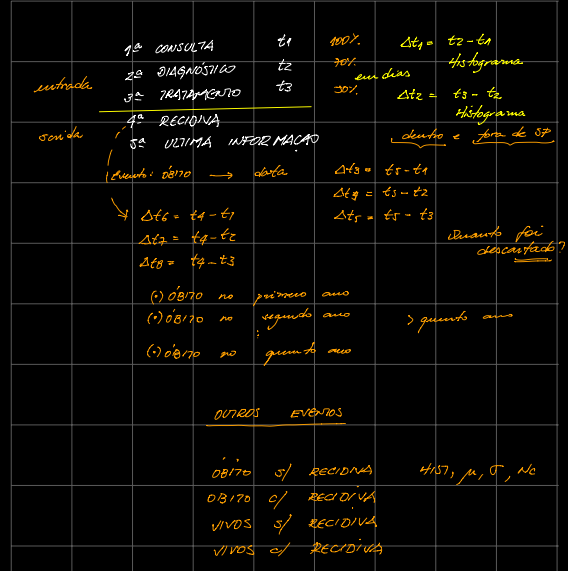

## **Dados**

In [3]:
df = pd.read_csv('/content/drive/MyDrive/Trabalho/Cancer/Datasets/cancer_preprocessing_dates.csv')
print(df.shape)
df.head()

(943660, 79)


,ESCOLARI,IDADE,SEXO,UFRESID,IBGE,CATEATEND,DTCONSULT,CLINICA,DIAGPREV,DTDIAG,BASEDIAG,TOPO,TOPOGRUP,MORFO,EC,ECGRUP,T,N,M,PT,PN,PM,G,LOCALTNM,IDMITOTIC,PSA,GLEASON,META01,META02,META03,META04,DTTRAT,NAOTRAT,TRATAMENTO,TRATHOSP,TRATFANTES,TRATFAPOS,NENHUM,CIRURGIA,RADIO,QUIMIO,HORMONIO,TMO,IMUNO,OUTROS,NENHUMANT,CIRURANT,RADIOANT,NENHUMAPOS,CIRURAPOS,RADIOAPOS,QUIMIOAPOS,HORMOAPOS,TMOAPOS,IMUNOAPOS,OUTROAPOS,DTULTINFO,ULTINFO,CONSDIAG,TRATCONS,DIAGTRAT,ANODIAG,CICI,CICIGRUP,FAIXAETAR,LATERALI,DRS,RRAS,PERDASEG,DTRECIDIVA,RECNENHUM,RECLOCAL,RECREGIO,RECDIST,REC01,REC02,REC03,REC04,IBGEATEN
0,4,40.0,2,26,3530805,9,2000-01-03,15,1,2000-01-10,3,222,45,81402,0,0,25,15,0,30,0,0,8,8,8,8,8,0,0,0,0,2000-07-04,8,0,0,2,9,0,1,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,2016-09-13,2,7,95.0,88.0,2000,23,5,4,8,14,15,1,NaN,1,0,0,0,0,0,0,0,3509502
1,9,45.0,2,26,3509502,9,2000-01-05,15,1,2000-01-17,3,222,45,80703,19,3,25,15,0,41,22,8,8,8,8,8,8,0,0,0,0,2000-01-20,8,5,5,2,9,0,0,1,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,2002-08-25,3,12,15.0,3.0,2000,23,5,4,8,7,15,0,NaN,1,0,0,0,0,0,0,0,3509502
2,2,63.0,2,26,3509502,9,2000-01-19,15,1,2000-01-25,3,222,45,80703,19,3,25,15,0,41,22,8,8,8,8,8,8,0,0,0,0,2000-03-02,8,1,1,2,9,0,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,2001-03-20,3,6,15.0,9.0,2000,23,5,6,8,7,15,0,NaN,1,0,0,0,0,0,0,0,3509502
3,9,64.0,2,26,3545803,9,2000-01-28,15,1,2000-02-03,3,222,45,80703,19,3,25,15,0,41,22,8,8,8,8,8,8,0,0,0,0,2000-01-03,8,1,1,2,9,0,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,2002-07-15,3,6,33.0,27.0,2000,23,5,6,8,7,15,0,NaN,1,0,0,0,0,0,0,0,3509502
4,1,48.0,2,26,3530805,9,2000-01-04,15,2,2000-01-04,3,222,45,80703,19,3,25,15,0,41,22,8,8,8,8,8,8,0,0,0,0,2000-05-15,8,1,1,2,9,0,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,2016-03-10,2,0,132.0,132.0,2000,23,5,4,8,14,15,1,NaN,1,0,0,0,0,0,0,0,3509502


In [4]:
# Data - DTCONSULT, DTDIAG, DTTRAT, DTULTINFO, DTRECIDIVA
lista_datas = ['DTCONSULT', 'DTDIAG', 'DTTRAT', 'DTULTINFO', 'DTRECIDIVA']
df[lista_datas].isna().sum()

DTCONSULT          0
DTDIAG             0
DTTRAT         74896
DTULTINFO         45
DTRECIDIVA    848760
dtype: int64

In [5]:
# Drop dos valores faltantes da variável DTTRAT
df = df.dropna(subset=['DTTRAT'])
df.isna().sum().sort_values(ascending=False).head()

DTRECIDIVA    775221
DTULTINFO         45
IDADE              1
META01             0
PN                 0
dtype: int64

In [6]:
df.shape

(868764, 79)

In [7]:
# Datas para formato Datetime
for c in lista_datas:
  df[c] = pd.to_datetime(df[c])

df[lista_datas].dtypes

DTCONSULT     datetime64[ns]
DTDIAG        datetime64[ns]
DTTRAT        datetime64[ns]
DTULTINFO     datetime64[ns]
DTRECIDIVA    datetime64[ns]
dtype: object

## **Criação das features e histogramas**

**Features das datas**

* Consulta - $t_1$

* Diagnóstico - $t_2$

* Tratamento - $t_3$

* Recidiva - $t_4$

* Última informação - $t_5$
---
**Diferenças, em dias, entre as datas:**

$$\Delta t_1 = t_2 - t_1$$

$$\Delta t_2 = t_3 - t_2$$

$$\Delta t_3 = t_3 - t_1$$

**Recidiva:**

$$\Delta t_4 = t_4 - t_1$$

$$\Delta t_5 = t_4 - t_2$$

$$\Delta t_6 = t_4 - t_3$$

**Última informação:**

$$\Delta t_7 = t_5 - t_1$$

$$\Delta t_8 = t_5 - t_2$$

$$\Delta t_9 = t_5 - t_3$$

In [8]:
with open('/content/drive/MyDrive/Trabalho/Cancer/Modelos/encoders_pp.pkl', 'rb') as handle:
  enc = pickle.load(handle)

enc_ufresid = enc['UFRESID']
df.UFRESID = enc_ufresid.inverse_transform(df.UFRESID)

In [9]:
dates = ['DTCONSULT', 'DTDIAG', 'DTTRAT', 'CONSDIAG', 'TRATCONS', 'DIAGTRAT', 'DTULTINFO', 'DTRECIDIVA']

### **SP**

In [10]:
df_SP = df[df.UFRESID == 'SP'].copy()
print(df_SP.shape)
df_SP.head(3)

(806445, 79)


,ESCOLARI,IDADE,SEXO,UFRESID,IBGE,CATEATEND,DTCONSULT,CLINICA,DIAGPREV,DTDIAG,BASEDIAG,TOPO,TOPOGRUP,MORFO,EC,ECGRUP,T,N,M,PT,PN,PM,G,LOCALTNM,IDMITOTIC,PSA,GLEASON,META01,META02,META03,META04,DTTRAT,NAOTRAT,TRATAMENTO,TRATHOSP,TRATFANTES,TRATFAPOS,NENHUM,CIRURGIA,RADIO,QUIMIO,HORMONIO,TMO,IMUNO,OUTROS,NENHUMANT,CIRURANT,RADIOANT,NENHUMAPOS,CIRURAPOS,RADIOAPOS,QUIMIOAPOS,HORMOAPOS,TMOAPOS,IMUNOAPOS,OUTROAPOS,DTULTINFO,ULTINFO,CONSDIAG,TRATCONS,DIAGTRAT,ANODIAG,CICI,CICIGRUP,FAIXAETAR,LATERALI,DRS,RRAS,PERDASEG,DTRECIDIVA,RECNENHUM,RECLOCAL,RECREGIO,RECDIST,REC01,REC02,REC03,REC04,IBGEATEN
0,4,40.0,2,SP,3530805,9,2000-01-03,15,1,2000-01-10,3,222,45,81402,0,0,25,15,0,30,0,0,8,8,8,8,8,0,0,0,0,2000-07-04,8,0,0,2,9,0,1,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,2016-09-13,2,7,95.0,88.0,2000,23,5,4,8,14,15,1,NaT,1,0,0,0,0,0,0,0,3509502
1,9,45.0,2,SP,3509502,9,2000-01-05,15,1,2000-01-17,3,222,45,80703,19,3,25,15,0,41,22,8,8,8,8,8,8,0,0,0,0,2000-01-20,8,5,5,2,9,0,0,1,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,2002-08-25,3,12,15.0,3.0,2000,23,5,4,8,7,15,0,NaT,1,0,0,0,0,0,0,0,3509502
2,2,63.0,2,SP,3509502,9,2000-01-19,15,1,2000-01-25,3,222,45,80703,19,3,25,15,0,41,22,8,8,8,8,8,8,0,0,0,0,2000-03-02,8,1,1,2,9,0,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,2001-03-20,3,6,15.0,9.0,2000,23,5,6,8,7,15,0,NaT,1,0,0,0,0,0,0,0,3509502


In [11]:
df_SP[dates].head(3)

,DTCONSULT,DTDIAG,DTTRAT,CONSDIAG,TRATCONS,DIAGTRAT,DTULTINFO,DTRECIDIVA
0,2000-01-03,2000-01-10,2000-07-04,7,95.0,88.0,2016-09-13,NaT
1,2000-01-05,2000-01-17,2000-01-20,12,15.0,3.0,2002-08-25,NaT
2,2000-01-19,2000-01-25,2000-03-02,6,15.0,9.0,2001-03-20,NaT


In [12]:
df_SP['delta_t1'] = (df_SP.DTDIAG - df_SP.DTCONSULT).dt.days
df_SP['delta_t2'] = (df_SP.DTTRAT - df_SP.DTDIAG).dt.days
df_SP['delta_t3'] = (df_SP.DTTRAT - df_SP.DTCONSULT).dt.days

date = dates + ['delta_t1', 'delta_t2', 'delta_t3']

df_SP[date].head(3)

,DTCONSULT,DTDIAG,DTTRAT,CONSDIAG,TRATCONS,DIAGTRAT,DTULTINFO,DTRECIDIVA,delta_t1,delta_t2,delta_t3
0,2000-01-03,2000-01-10,2000-07-04,7,95.0,88.0,2016-09-13,NaT,7,176,183
1,2000-01-05,2000-01-17,2000-01-20,12,15.0,3.0,2002-08-25,NaT,12,3,15
2,2000-01-19,2000-01-25,2000-03-02,6,15.0,9.0,2001-03-20,NaT,6,37,43


In [13]:
df_SP['delta_t4'] = (df_SP.DTRECIDIVA - df_SP.DTCONSULT).dt.days
df_SP['delta_t5'] = (df_SP.DTRECIDIVA - df_SP.DTDIAG).dt.days
df_SP['delta_t6'] = (df_SP.DTRECIDIVA - df_SP.DTTRAT).dt.days

dt = date + ['delta_t4', 'delta_t5', 'delta_t6']

df_SP[dt].head(3)

,DTCONSULT,DTDIAG,DTTRAT,CONSDIAG,TRATCONS,DIAGTRAT,DTULTINFO,DTRECIDIVA,delta_t1,delta_t2,delta_t3,delta_t4,delta_t5,delta_t6
0,2000-01-03,2000-01-10,2000-07-04,7,95.0,88.0,2016-09-13,NaT,7,176,183,NaN,NaN,NaN
1,2000-01-05,2000-01-17,2000-01-20,12,15.0,3.0,2002-08-25,NaT,12,3,15,NaN,NaN,NaN
2,2000-01-19,2000-01-25,2000-03-02,6,15.0,9.0,2001-03-20,NaT,6,37,43,NaN,NaN,NaN


In [14]:
df_SP['delta_t7'] = (df_SP.DTULTINFO - df_SP.DTCONSULT).dt.days
df_SP['delta_t8'] = (df_SP.DTULTINFO - df_SP.DTDIAG).dt.days
df_SP['delta_t9'] = (df_SP.DTULTINFO - df_SP.DTTRAT).dt.days

dt_total = dt + ['delta_t7', 'delta_t8', 'delta_t9']

df_SP[dt_total].head(3)

,DTCONSULT,DTDIAG,DTTRAT,CONSDIAG,TRATCONS,DIAGTRAT,DTULTINFO,DTRECIDIVA,delta_t1,delta_t2,delta_t3,delta_t4,delta_t5,delta_t6,delta_t7,delta_t8,delta_t9
0,2000-01-03,2000-01-10,2000-07-04,7,95.0,88.0,2016-09-13,NaT,7,176,183,NaN,NaN,NaN,6098.0,6091.0,5915.0
1,2000-01-05,2000-01-17,2000-01-20,12,15.0,3.0,2002-08-25,NaT,12,3,15,NaN,NaN,NaN,963.0,951.0,948.0
2,2000-01-19,2000-01-25,2000-03-02,6,15.0,9.0,2001-03-20,NaT,6,37,43,NaN,NaN,NaN,426.0,420.0,383.0


### **Histogramas**

In [ ]:
fig = px.histogram(df_SP, x="delta_t1", marginal='box',
                   title='Diferença de dias entre diagnóstico e consulta')
fig.show()

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
fig = px.histogram(df_SP, x="delta_t2", marginal='box',
                   title='Diferença de dias entre tratamento e diagnóstico')
fig.show()

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
fig = px.histogram(df_SP, x="delta_t3", marginal='box', 
                   title='Diferença de dias entre tratamento e consulta')
fig.show()

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
fig = px.histogram(df_SP, x="delta_t4", marginal='box',
                   title='Diferença de dias entre recidiva e consulta')
fig.show()

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
fig = px.histogram(df_SP, x="delta_t5", marginal='box',
                   title='Diferença de dias entre recidiva e diagnóstico')
fig.show()

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
fig = px.histogram(df_SP, x="delta_t6", marginal='box', 
                   title='Diferença de dias entre recidiva e tratamento')
fig.show()

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
fig = px.histogram(df_SP, x="delta_t7", marginal='box',
                   title='Diferença de dias entre última informação e consulta')
fig.show()

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
fig = px.histogram(df_SP, x="delta_t8", marginal='box',
                   title='Diferença de dias entre última informação e diagnóstico')
fig.show()

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
fig = px.histogram(df_SP, x="delta_t9", marginal='box', 
                   title='Diferença de dias entre última informação e tratamento')
fig.show()

### **Fora de SP**

In [15]:
df_fora = df[df.UFRESID != 'SP'].copy()
print(df_fora.shape)
df_fora.head(3)

(62319, 79)


,ESCOLARI,IDADE,SEXO,UFRESID,IBGE,CATEATEND,DTCONSULT,CLINICA,DIAGPREV,DTDIAG,BASEDIAG,TOPO,TOPOGRUP,MORFO,EC,ECGRUP,T,N,M,PT,PN,PM,G,LOCALTNM,IDMITOTIC,PSA,GLEASON,META01,META02,META03,META04,DTTRAT,NAOTRAT,TRATAMENTO,TRATHOSP,TRATFANTES,TRATFAPOS,NENHUM,CIRURGIA,RADIO,QUIMIO,HORMONIO,TMO,IMUNO,OUTROS,NENHUMANT,CIRURANT,RADIOANT,NENHUMAPOS,CIRURAPOS,RADIOAPOS,QUIMIOAPOS,HORMOAPOS,TMOAPOS,IMUNOAPOS,OUTROAPOS,DTULTINFO,ULTINFO,CONSDIAG,TRATCONS,DIAGTRAT,ANODIAG,CICI,CICIGRUP,FAIXAETAR,LATERALI,DRS,RRAS,PERDASEG,DTRECIDIVA,RECNENHUM,RECLOCAL,RECREGIO,RECDIST,REC01,REC02,REC03,REC04,IBGEATEN
15,5,56.0,2,MG,3167400,9,2000-01-19,33,1,2000-01-26,3,212,42,85202,3,1,1,0,0,1,0,0,8,8,8,8,8,0,0,0,0,2000-03-22,8,3,3,2,9,0,1,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,2018-01-24,2,7,63.0,56.0,2000,23,5,5,8,0,99,1,NaT,1,0,0,0,0,0,0,0,3509502
29,2,48.0,2,MG,3159605,9,2000-02-07,33,1,2000-03-09,3,212,42,80102,0,0,23,0,0,30,0,0,8,8,8,8,8,0,0,0,0,2000-06-04,8,0,0,2,9,0,1,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,2016-04-04,2,31,59.0,28.0,2000,23,5,4,8,0,99,1,NaT,1,0,0,0,0,0,0,0,3509502
32,2,63.0,2,MG,3143401,9,2000-01-31,33,1,2000-02-09,2,212,42,80102,0,0,23,0,0,30,0,0,8,8,8,8,8,0,0,0,0,2000-03-22,8,0,0,2,9,0,1,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,2016-09-14,2,9,51.0,42.0,2000,23,5,6,8,0,99,1,NaT,1,0,0,0,0,0,0,0,3509502


In [16]:
df_fora[dates].head(2)

,DTCONSULT,DTDIAG,DTTRAT,CONSDIAG,TRATCONS,DIAGTRAT,DTULTINFO,DTRECIDIVA
15,2000-01-19,2000-01-26,2000-03-22,7,63.0,56.0,2018-01-24,NaT
29,2000-02-07,2000-03-09,2000-06-04,31,59.0,28.0,2016-04-04,NaT


In [17]:
df_fora['delta_t1'] = (df_fora.DTDIAG - df_fora.DTCONSULT).dt.days
df_fora['delta_t2'] = (df_fora.DTTRAT - df_fora.DTDIAG).dt.days
df_fora['delta_t3'] = (df_fora.DTTRAT - df_fora.DTCONSULT).dt.days

date = dates + ['delta_t1', 'delta_t2', 'delta_t3']

df_fora[date].head(3)

,DTCONSULT,DTDIAG,DTTRAT,CONSDIAG,TRATCONS,DIAGTRAT,DTULTINFO,DTRECIDIVA,delta_t1,delta_t2,delta_t3
15,2000-01-19,2000-01-26,2000-03-22,7,63.0,56.0,2018-01-24,NaT,7,56,63
29,2000-02-07,2000-03-09,2000-06-04,31,59.0,28.0,2016-04-04,NaT,31,87,118
32,2000-01-31,2000-02-09,2000-03-22,9,51.0,42.0,2016-09-14,NaT,9,42,51


In [18]:
df_fora['delta_t4'] = (df_fora.DTRECIDIVA - df_fora.DTCONSULT).dt.days
df_fora['delta_t5'] = (df_fora.DTRECIDIVA - df_fora.DTDIAG).dt.days
df_fora['delta_t6'] = (df_fora.DTRECIDIVA - df_fora.DTTRAT).dt.days

dt = date + ['delta_t4', 'delta_t5', 'delta_t6']

df_fora[dt].head(3)

,DTCONSULT,DTDIAG,DTTRAT,CONSDIAG,TRATCONS,DIAGTRAT,DTULTINFO,DTRECIDIVA,delta_t1,delta_t2,delta_t3,delta_t4,delta_t5,delta_t6
15,2000-01-19,2000-01-26,2000-03-22,7,63.0,56.0,2018-01-24,NaT,7,56,63,NaN,NaN,NaN
29,2000-02-07,2000-03-09,2000-06-04,31,59.0,28.0,2016-04-04,NaT,31,87,118,NaN,NaN,NaN
32,2000-01-31,2000-02-09,2000-03-22,9,51.0,42.0,2016-09-14,NaT,9,42,51,NaN,NaN,NaN


In [19]:
df_fora['delta_t7'] = (df_fora.DTULTINFO - df_fora.DTCONSULT).dt.days
df_fora['delta_t8'] = (df_fora.DTULTINFO - df_fora.DTDIAG).dt.days
df_fora['delta_t9'] = (df_fora.DTULTINFO - df_fora.DTTRAT).dt.days

dt_total = dt + ['delta_t7', 'delta_t8', 'delta_t9']

df_fora[dt_total].head(3)

,DTCONSULT,DTDIAG,DTTRAT,CONSDIAG,TRATCONS,DIAGTRAT,DTULTINFO,DTRECIDIVA,delta_t1,delta_t2,delta_t3,delta_t4,delta_t5,delta_t6,delta_t7,delta_t8,delta_t9
15,2000-01-19,2000-01-26,2000-03-22,7,63.0,56.0,2018-01-24,NaT,7,56,63,NaN,NaN,NaN,6580.0,6573.0,6517.0
29,2000-02-07,2000-03-09,2000-06-04,31,59.0,28.0,2016-04-04,NaT,31,87,118,NaN,NaN,NaN,5901.0,5870.0,5783.0
32,2000-01-31,2000-02-09,2000-03-22,9,51.0,42.0,2016-09-14,NaT,9,42,51,NaN,NaN,NaN,6071.0,6062.0,6020.0


### **Histogramas**

In [ ]:
fig = px.histogram(df_fora, x="delta_t1", marginal='box',
                   title='Diferença de dias entre diagnóstico e consulta')
fig.show()

In [ ]:
fig = px.histogram(df_fora, x="delta_t2", marginal='box',
                   title='Diferença de dias entre tratamento e diagnóstico')
fig.show()

In [ ]:
fig = px.histogram(df_fora, x="delta_t3", marginal='box', 
                   title='Diferença de dias entre tratamento e consulta')
fig.show()

In [ ]:
fig = px.histogram(df_fora, x="delta_t4", marginal='box',
                   title='Diferença de dias entre recidiva e consulta')
fig.show()

In [ ]:
fig = px.histogram(df_fora, x="delta_t5", marginal='box',
                   title='Diferença de dias entre recidiva e diagnóstico')
fig.show()

In [ ]:
fig = px.histogram(df_fora, x="delta_t6", marginal='box', 
                   title='Diferença de dias entre recidiva e tratamento')
fig.show()

In [ ]:
fig = px.histogram(df_fora, x="delta_t7", marginal='box',
                   title='Diferença de dias entre última informação e consulta')
fig.show()

In [ ]:
fig = px.histogram(df_fora, x="delta_t8", marginal='box',
                   title='Diferença de dias entre última informação e diagnóstico')
fig.show()

In [ ]:
fig = px.histogram(df_fora, x="delta_t9", marginal='box', 
                   title='Diferença de dias entre última informação e tratamento')
fig.show()

## **Criação dos labels de óbito**

**Labels**
* Óbito em qualquer momento - $ob$

* Óbito no primeiro ano - $ob_1$

* Óbito no segundo ano - $ob_2$

* Óbito no terceiro ano - $ob_3$

* Óbito no quarto ano - $ob_4$

* Óbito no quinto ano - $ob_5$

* Óbito com mais de cinco anos - $ob_6$
---

**Última informação**

1 - VIVO, COM CÂNCER

2 – VIVO, SOE

3 – OBITO POR CANCER

4 – OBITO POR OUTRAS CAUSAS, SOE


In [27]:
def get_label(df):
  """Função para criar os labels de óbito de acordo com o ano"""

  for i in range(6):
    df[f'ob_{i+1}'] = 0
    for index, row in df.iterrows():
      if row.ob == 1 and row.delta_t8 < (i+1)*365:
        df[f'ob_{i+1}'][index] = 1

  return df

### **SP**

In [42]:
df_SP.head(2)

,ESCOLARI,IDADE,SEXO,UFRESID,IBGE,CATEATEND,DTCONSULT,CLINICA,DIAGPREV,DTDIAG,BASEDIAG,TOPO,TOPOGRUP,MORFO,EC,ECGRUP,T,N,M,PT,PN,PM,G,LOCALTNM,IDMITOTIC,PSA,GLEASON,META01,META02,META03,META04,DTTRAT,NAOTRAT,TRATAMENTO,TRATHOSP,TRATFANTES,TRATFAPOS,NENHUM,CIRURGIA,RADIO,...,NENHUMAPOS,CIRURAPOS,RADIOAPOS,QUIMIOAPOS,HORMOAPOS,TMOAPOS,IMUNOAPOS,OUTROAPOS,DTULTINFO,ULTINFO,CONSDIAG,TRATCONS,DIAGTRAT,ANODIAG,CICI,CICIGRUP,FAIXAETAR,LATERALI,DRS,RRAS,PERDASEG,DTRECIDIVA,RECNENHUM,RECLOCAL,RECREGIO,RECDIST,REC01,REC02,REC03,REC04,IBGEATEN,delta_t1,delta_t2,delta_t3,delta_t4,delta_t5,delta_t6,delta_t7,delta_t8,delta_t9
0,4,40.0,2,SP,3530805,9,2000-01-03,15,1,2000-01-10,3,222,45,81402,0,0,25,15,0,30,0,0,8,8,8,8,8,0,0,0,0,2000-07-04,8,0,0,2,9,0,1,0,...,1,0,0,0,0,0,0,0,2016-09-13,2,7,95.0,88.0,2000,23,5,4,8,14,15,1,NaT,1,0,0,0,0,0,0,0,3509502,7,176,183,NaN,NaN,NaN,6098.0,6091.0,5915.0
1,9,45.0,2,SP,3509502,9,2000-01-05,15,1,2000-01-17,3,222,45,80703,19,3,25,15,0,41,22,8,8,8,8,8,8,0,0,0,0,2000-01-20,8,5,5,2,9,0,0,1,...,1,0,0,0,0,0,0,0,2002-08-25,3,12,15.0,3.0,2000,23,5,4,8,7,15,0,NaT,1,0,0,0,0,0,0,0,3509502,12,3,15,NaN,NaN,NaN,963.0,951.0,948.0


In [43]:
df_SP.ULTINFO.value_counts()

2    384579
3    216244
4    109434
1     96188
Name: ULTINFO, dtype: int64

In [44]:
df_SP['ob'] = 0
for index, row in df_SP.iterrows():
  if row.ULTINFO > 2:
    df_SP['ob'][index] = 1

In [45]:
df_SP.ob.value_counts()

0    480767
1    325678
Name: ob, dtype: int64

In [46]:
### Delta t8 negativo - data última info antes da data do diagnóstico?
print(df_SP[dt_total][df_SP.delta_t8 < 0].shape)
df_SP[dt_total][df_SP.delta_t8 < 0].head(3)

(15, 17)


,DTCONSULT,DTDIAG,DTTRAT,CONSDIAG,TRATCONS,DIAGTRAT,DTULTINFO,DTRECIDIVA,delta_t1,delta_t2,delta_t3,delta_t4,delta_t5,delta_t6,delta_t7,delta_t8,delta_t9
29168,2016-02-24,2016-02-24,2016-03-31,0,36.0,36.0,2015-05-23,NaT,0,36,36,NaN,NaN,NaN,-277.0,-277.0,-313.0
126329,2015-09-01,2015-07-29,2015-01-09,34,0.0,34.0,2015-07-01,NaT,-34,-201,-235,NaN,NaN,NaN,-62.0,-28.0,173.0
126353,2015-10-09,2015-08-19,2015-09-10,51,0.0,51.0,2015-07-01,NaT,-51,22,-29,NaN,NaN,NaN,-100.0,-49.0,-71.0


In [47]:
df_SP = get_label(df_SP)

In [48]:
df_SP.head(2)

,ESCOLARI,IDADE,SEXO,UFRESID,IBGE,CATEATEND,DTCONSULT,CLINICA,DIAGPREV,DTDIAG,BASEDIAG,TOPO,TOPOGRUP,MORFO,EC,ECGRUP,T,N,M,PT,PN,PM,G,LOCALTNM,IDMITOTIC,PSA,GLEASON,META01,META02,META03,META04,DTTRAT,NAOTRAT,TRATAMENTO,TRATHOSP,TRATFANTES,TRATFAPOS,NENHUM,CIRURGIA,RADIO,...,OUTROAPOS,DTULTINFO,ULTINFO,CONSDIAG,TRATCONS,DIAGTRAT,ANODIAG,CICI,CICIGRUP,FAIXAETAR,LATERALI,DRS,RRAS,PERDASEG,DTRECIDIVA,RECNENHUM,RECLOCAL,RECREGIO,RECDIST,REC01,REC02,REC03,REC04,IBGEATEN,delta_t1,delta_t2,delta_t3,delta_t4,delta_t5,delta_t6,delta_t7,delta_t8,delta_t9,ob,ob_1,ob_2,ob_3,ob_4,ob_5,ob_6
0,4,40.0,2,SP,3530805,9,2000-01-03,15,1,2000-01-10,3,222,45,81402,0,0,25,15,0,30,0,0,8,8,8,8,8,0,0,0,0,2000-07-04,8,0,0,2,9,0,1,0,...,0,2016-09-13,2,7,95.0,88.0,2000,23,5,4,8,14,15,1,NaT,1,0,0,0,0,0,0,0,3509502,7,176,183,NaN,NaN,NaN,6098.0,6091.0,5915.0,0,0,0,0,0,0,0
1,9,45.0,2,SP,3509502,9,2000-01-05,15,1,2000-01-17,3,222,45,80703,19,3,25,15,0,41,22,8,8,8,8,8,8,0,0,0,0,2000-01-20,8,5,5,2,9,0,0,1,...,0,2002-08-25,3,12,15.0,3.0,2000,23,5,4,8,7,15,0,NaT,1,0,0,0,0,0,0,0,3509502,12,3,15,NaN,NaN,NaN,963.0,951.0,948.0,1,0,0,1,1,1,1


In [50]:
df_SP.ob_1.value_counts()

0    684626
1    121819
Name: ob_1, dtype: int64

In [51]:
df_SP.ob_2.value_counts()

0    617362
1    189083
Name: ob_2, dtype: int64

In [52]:
df_SP.ob_3.value_counts()

0    580057
1    226388
Name: ob_3, dtype: int64

In [53]:
df_SP.ob_4.value_counts()

0    555490
1    250955
Name: ob_4, dtype: int64

In [54]:
df_SP.ob_5.value_counts()

0    537638
1    268807
Name: ob_5, dtype: int64

In [55]:
df_SP.ob_6.value_counts()

0    524479
1    281966
Name: ob_6, dtype: int64

In [56]:
df_SP.to_csv('/content/drive/MyDrive/Trabalho/Cancer/Datasets/cancer_SP_labels_ob_rec.csv', encoding='utf-8', index=False)

### **Fora de SP**

In [57]:
df_fora.head(2)

,ESCOLARI,IDADE,SEXO,UFRESID,IBGE,CATEATEND,DTCONSULT,CLINICA,DIAGPREV,DTDIAG,BASEDIAG,TOPO,TOPOGRUP,MORFO,EC,ECGRUP,T,N,M,PT,PN,PM,G,LOCALTNM,IDMITOTIC,PSA,GLEASON,META01,META02,META03,META04,DTTRAT,NAOTRAT,TRATAMENTO,TRATHOSP,TRATFANTES,TRATFAPOS,NENHUM,CIRURGIA,RADIO,...,OUTROAPOS,DTULTINFO,ULTINFO,CONSDIAG,TRATCONS,DIAGTRAT,ANODIAG,CICI,CICIGRUP,FAIXAETAR,LATERALI,DRS,RRAS,PERDASEG,DTRECIDIVA,RECNENHUM,RECLOCAL,RECREGIO,RECDIST,REC01,REC02,REC03,REC04,IBGEATEN,delta_t1,delta_t2,delta_t3,delta_t4,delta_t5,delta_t6,delta_t7,delta_t8,delta_t9,ob,ob_1,ob_2,ob_3,ob_4,ob_5,ob_6
15,5,56.0,2,MG,3167400,9,2000-01-19,33,1,2000-01-26,3,212,42,85202,3,1,1,0,0,1,0,0,8,8,8,8,8,0,0,0,0,2000-03-22,8,3,3,2,9,0,1,1,...,0,2018-01-24,2,7,63.0,56.0,2000,23,5,5,8,0,99,1,NaT,1,0,0,0,0,0,0,0,3509502,7,56,63,NaN,NaN,NaN,6580.0,6573.0,6517.0,0,0,0,0,0,0,0
29,2,48.0,2,MG,3159605,9,2000-02-07,33,1,2000-03-09,3,212,42,80102,0,0,23,0,0,30,0,0,8,8,8,8,8,0,0,0,0,2000-06-04,8,0,0,2,9,0,1,0,...,0,2016-04-04,2,31,59.0,28.0,2000,23,5,4,8,0,99,1,NaT,1,0,0,0,0,0,0,0,3509502,31,87,118,NaN,NaN,NaN,5901.0,5870.0,5783.0,0,0,0,0,0,0,0


In [58]:
df_fora.ULTINFO.value_counts()

2    37046
3    12820
1     7547
4     4906
Name: ULTINFO, dtype: int64

In [59]:
df_fora['ob'] = 0
for index, row in df_fora.iterrows():
  if row.ULTINFO > 2:
    df_fora.loc[index, 'ob'] = 1

In [60]:
### Delta t8 negativo - data última info antes da data do diagnóstico?
print(df_fora[dt_total][df_fora.delta_t8 < 0].shape)
df_fora[dt_total][df_fora.delta_t8 < 0].head(3)

(3, 17)


,DTCONSULT,DTDIAG,DTTRAT,CONSDIAG,TRATCONS,DIAGTRAT,DTULTINFO,DTRECIDIVA,delta_t1,delta_t2,delta_t3,delta_t4,delta_t5,delta_t6,delta_t7,delta_t8,delta_t9
230305,2018-12-27,2019-01-19,2019-01-19,23,23.0,0.0,2019-01-17,NaT,23,0,23,NaN,NaN,NaN,21.0,-2.0,-2.0
489581,2009-09-20,2009-11-11,2009-11-11,52,52.0,0.0,2007-05-02,NaT,52,0,52,NaN,NaN,NaN,-872.0,-924.0,-924.0
566974,2018-02-20,2018-04-02,2018-02-04,41,41.0,0.0,2017-12-22,NaT,41,-57,-16,NaN,NaN,NaN,-60.0,-101.0,-44.0


In [61]:
df_fora = get_label(df_fora)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [62]:
df_fora.head(5)

,ESCOLARI,IDADE,SEXO,UFRESID,IBGE,CATEATEND,DTCONSULT,CLINICA,DIAGPREV,DTDIAG,BASEDIAG,TOPO,TOPOGRUP,MORFO,EC,ECGRUP,T,N,M,PT,PN,PM,G,LOCALTNM,IDMITOTIC,PSA,GLEASON,META01,META02,META03,META04,DTTRAT,NAOTRAT,TRATAMENTO,TRATHOSP,TRATFANTES,TRATFAPOS,NENHUM,CIRURGIA,RADIO,...,OUTROAPOS,DTULTINFO,ULTINFO,CONSDIAG,TRATCONS,DIAGTRAT,ANODIAG,CICI,CICIGRUP,FAIXAETAR,LATERALI,DRS,RRAS,PERDASEG,DTRECIDIVA,RECNENHUM,RECLOCAL,RECREGIO,RECDIST,REC01,REC02,REC03,REC04,IBGEATEN,delta_t1,delta_t2,delta_t3,delta_t4,delta_t5,delta_t6,delta_t7,delta_t8,delta_t9,ob,ob_1,ob_2,ob_3,ob_4,ob_5,ob_6
15,5,56.0,2,MG,3167400,9,2000-01-19,33,1,2000-01-26,3,212,42,85202,3,1,1,0,0,1,0,0,8,8,8,8,8,0,0,0,0,2000-03-22,8,3,3,2,9,0,1,1,...,0,2018-01-24,2,7,63.0,56.0,2000,23,5,5,8,0,99,1,NaT,1,0,0,0,0,0,0,0,3509502,7,56,63,NaN,NaN,NaN,6580.0,6573.0,6517.0,0,0,0,0,0,0,0
29,2,48.0,2,MG,3159605,9,2000-02-07,33,1,2000-03-09,3,212,42,80102,0,0,23,0,0,30,0,0,8,8,8,8,8,0,0,0,0,2000-06-04,8,0,0,2,9,0,1,0,...,0,2016-04-04,2,31,59.0,28.0,2000,23,5,4,8,0,99,1,NaT,1,0,0,0,0,0,0,0,3509502,31,87,118,NaN,NaN,NaN,5901.0,5870.0,5783.0,0,0,0,0,0,0,0
32,2,63.0,2,MG,3143401,9,2000-01-31,33,1,2000-02-09,2,212,42,80102,0,0,23,0,0,30,0,0,8,8,8,8,8,0,0,0,0,2000-03-22,8,0,0,2,9,0,1,0,...,0,2016-09-14,2,9,51.0,42.0,2000,23,5,6,8,0,99,1,NaT,1,0,0,0,0,0,0,0,3509502,9,42,51,NaN,NaN,NaN,6071.0,6062.0,6020.0,0,0,0,0,0,0,0
41,2,52.0,2,MG,3108305,9,2000-01-19,33,1,2000-02-01,3,212,42,85003,12,2,6,0,0,1,0,0,8,8,8,8,8,0,0,0,0,2000-03-22,8,6,6,2,9,0,1,1,...,0,2007-02-04,4,13,63.0,50.0,2000,23,5,5,8,0,99,0,2005-09-26,0,0,1,0,62,20,0,0,3509502,13,50,63,2077.0,2064.0,2014.0,2573.0,2560.0,2510.0,1,0,0,0,0,0,0
53,9,52.0,2,MG,3113602,2,2000-03-28,33,1,2000-04-26,3,212,42,85003,12,2,6,0,0,41,22,8,8,8,8,8,8,0,0,0,0,2000-04-26,8,5,5,2,9,0,0,1,...,0,2012-12-31,4,29,29.0,0.0,2000,23,5,5,8,0,99,0,NaT,1,0,0,0,0,0,0,0,3509502,29,0,29,NaN,NaN,NaN,4661.0,4632.0,4632.0,1,0,0,0,0,0,0


In [63]:
df_fora.ob.value_counts()

0    44593
1    17726
Name: ob, dtype: int64

In [64]:
df_fora.ob_1.value_counts()

0    55025
1     7294
Name: ob_1, dtype: int64

In [65]:
df_fora.ob_2.value_counts()

0    51039
1    11280
Name: ob_2, dtype: int64

In [66]:
df_fora.ob_3.value_counts()

0    48991
1    13328
Name: ob_3, dtype: int64

In [67]:
df_fora.ob_4.value_counts()

0    47691
1    14628
Name: ob_4, dtype: int64

In [68]:
df_fora.ob_5.value_counts()

0    46823
1    15496
Name: ob_5, dtype: int64

In [69]:
df_fora.ob_6.value_counts()

0    46214
1    16105
Name: ob_6, dtype: int64

In [70]:
df_fora.to_csv('/content/drive/MyDrive/Trabalho/Cancer/Datasets/cancer_foraSP_labels_ob_rec.csv', encoding='utf-8', index=False)

## **Criação dos labels de recidiva**

**Features das datas**
* Óbito sem recidiva - ob_sem_rec

* Óbito com recidiva - ob_com_rec

* Vivos sem recidiva - vivo_sem_rec

* Vivos com recidiva - vivo_com_rec
---

**Última informação**

1 - VIVO, COM CÂNCER

2 – VIVO, SOE

3 – OBITO POR CANCER

4 – OBITO POR OUTRAS CAUSAS, SOE


In [71]:
df_SP = pd.read_csv('/content/drive/MyDrive/Trabalho/Cancer/Datasets/cancer_SP_labels_ob_rec.csv')
df_fora = pd.read_csv('/content/drive/MyDrive/Trabalho/Cancer/Datasets/cancer_foraSP_labels_ob_rec.csv')

In [72]:
def get_label_rec(df):
  """Função para criar os labels analisando se houve ou não recidiva"""

  df['ob_com_rec'] = 0
  df['ob_sem_rec'] = 0
  df['vivo_com_rec'] = 0
  df['vivo_sem_rec'] = 0

  for i, row in df.iterrows():
    if row['ob'] == 1:
      if row.RECNENHUM == 1:
        df['ob_sem_rec'][i] = 1
      else:
        df['ob_com_rec'][i] = 1
        
    else:
      if row.RECNENHUM == 1:
        df['vivo_sem_rec'][i] = 1
      else:
        df['vivo_com_rec'][i] = 1

  return df

### **SP**

In [81]:
df_SP.head(2)

,ESCOLARI,IDADE,SEXO,UFRESID,IBGE,CATEATEND,DTCONSULT,CLINICA,DIAGPREV,DTDIAG,BASEDIAG,TOPO,TOPOGRUP,MORFO,EC,ECGRUP,T,N,M,PT,PN,PM,G,LOCALTNM,IDMITOTIC,PSA,GLEASON,META01,META02,META03,META04,DTTRAT,NAOTRAT,TRATAMENTO,TRATHOSP,TRATFANTES,TRATFAPOS,NENHUM,CIRURGIA,RADIO,...,OUTROAPOS,DTULTINFO,ULTINFO,CONSDIAG,TRATCONS,DIAGTRAT,ANODIAG,CICI,CICIGRUP,FAIXAETAR,LATERALI,DRS,RRAS,PERDASEG,DTRECIDIVA,RECNENHUM,RECLOCAL,RECREGIO,RECDIST,REC01,REC02,REC03,REC04,IBGEATEN,delta_t1,delta_t2,delta_t3,delta_t4,delta_t5,delta_t6,delta_t7,delta_t8,delta_t9,ob,ob_1,ob_2,ob_3,ob_4,ob_5,ob_6
0,4,40.0,2,SP,3530805,9,2000-01-03,15,1,2000-01-10,3,222,45,81402,0,0,25,15,0,30,0,0,8,8,8,8,8,0,0,0,0,2000-07-04,8,0,0,2,9,0,1,0,...,0,2016-09-13,2,7,95.0,88.0,2000,23,5,4,8,14,15,1,NaN,1,0,0,0,0,0,0,0,3509502,7,176,183,NaN,NaN,NaN,6098.0,6091.0,5915.0,0,0,0,0,0,0,0
1,9,45.0,2,SP,3509502,9,2000-01-05,15,1,2000-01-17,3,222,45,80703,19,3,25,15,0,41,22,8,8,8,8,8,8,0,0,0,0,2000-01-20,8,5,5,2,9,0,0,1,...,0,2002-08-25,3,12,15.0,3.0,2000,23,5,4,8,7,15,0,NaN,1,0,0,0,0,0,0,0,3509502,12,3,15,NaN,NaN,NaN,963.0,951.0,948.0,1,0,0,1,1,1,1


In [82]:
df_SP = get_label_rec(df_SP)

In [83]:
df_SP.head(2)

,ESCOLARI,IDADE,SEXO,UFRESID,IBGE,CATEATEND,DTCONSULT,CLINICA,DIAGPREV,DTDIAG,BASEDIAG,TOPO,TOPOGRUP,MORFO,EC,ECGRUP,T,N,M,PT,PN,PM,G,LOCALTNM,IDMITOTIC,PSA,GLEASON,META01,META02,META03,META04,DTTRAT,NAOTRAT,TRATAMENTO,TRATHOSP,TRATFANTES,TRATFAPOS,NENHUM,CIRURGIA,RADIO,...,TRATCONS,DIAGTRAT,ANODIAG,CICI,CICIGRUP,FAIXAETAR,LATERALI,DRS,RRAS,PERDASEG,DTRECIDIVA,RECNENHUM,RECLOCAL,RECREGIO,RECDIST,REC01,REC02,REC03,REC04,IBGEATEN,delta_t1,delta_t2,delta_t3,delta_t4,delta_t5,delta_t6,delta_t7,delta_t8,delta_t9,ob,ob_1,ob_2,ob_3,ob_4,ob_5,ob_6,ob_com_rec,ob_sem_rec,vivo_com_rec,vivo_sem_rec
0,4,40.0,2,SP,3530805,9,2000-01-03,15,1,2000-01-10,3,222,45,81402,0,0,25,15,0,30,0,0,8,8,8,8,8,0,0,0,0,2000-07-04,8,0,0,2,9,0,1,0,...,95.0,88.0,2000,23,5,4,8,14,15,1,NaN,1,0,0,0,0,0,0,0,3509502,7,176,183,NaN,NaN,NaN,6098.0,6091.0,5915.0,0,0,0,0,0,0,0,0,0,0,1
1,9,45.0,2,SP,3509502,9,2000-01-05,15,1,2000-01-17,3,222,45,80703,19,3,25,15,0,41,22,8,8,8,8,8,8,0,0,0,0,2000-01-20,8,5,5,2,9,0,0,1,...,15.0,3.0,2000,23,5,4,8,7,15,0,NaN,1,0,0,0,0,0,0,0,3509502,12,3,15,NaN,NaN,NaN,963.0,951.0,948.0,1,0,0,1,1,1,1,0,1,0,0


In [84]:
df_SP.ob_com_rec.value_counts()

0    754212
1     52233
Name: ob_com_rec, dtype: int64

In [85]:
df_SP.ob_sem_rec.value_counts()	

0    533000
1    273445
Name: ob_sem_rec, dtype: int64

In [86]:
df_SP.vivo_com_rec.value_counts()	

0    784909
1     21536
Name: vivo_com_rec, dtype: int64

In [87]:
df_SP.vivo_sem_rec.value_counts()	

1    459231
0    347214
Name: vivo_sem_rec, dtype: int64

In [88]:
df_SP.to_csv('/content/drive/MyDrive/Trabalho/Cancer/Datasets/cancer_SP_labels_ob_rec.csv', encoding='utf-8', index=False)

### **Fora de SP**

In [73]:
df_fora.head(2)

,ESCOLARI,IDADE,SEXO,UFRESID,IBGE,CATEATEND,DTCONSULT,CLINICA,DIAGPREV,DTDIAG,BASEDIAG,TOPO,TOPOGRUP,MORFO,EC,ECGRUP,T,N,M,PT,PN,PM,G,LOCALTNM,IDMITOTIC,PSA,GLEASON,META01,META02,META03,META04,DTTRAT,NAOTRAT,TRATAMENTO,TRATHOSP,TRATFANTES,TRATFAPOS,NENHUM,CIRURGIA,RADIO,...,OUTROAPOS,DTULTINFO,ULTINFO,CONSDIAG,TRATCONS,DIAGTRAT,ANODIAG,CICI,CICIGRUP,FAIXAETAR,LATERALI,DRS,RRAS,PERDASEG,DTRECIDIVA,RECNENHUM,RECLOCAL,RECREGIO,RECDIST,REC01,REC02,REC03,REC04,IBGEATEN,delta_t1,delta_t2,delta_t3,delta_t4,delta_t5,delta_t6,delta_t7,delta_t8,delta_t9,ob,ob_1,ob_2,ob_3,ob_4,ob_5,ob_6
0,5,56.0,2,MG,3167400,9,2000-01-19,33,1,2000-01-26,3,212,42,85202,3,1,1,0,0,1,0,0,8,8,8,8,8,0,0,0,0,2000-03-22,8,3,3,2,9,0,1,1,...,0,2018-01-24,2,7,63.0,56.0,2000,23,5,5,8,0,99,1,NaN,1,0,0,0,0,0,0,0,3509502,7,56,63,NaN,NaN,NaN,6580.0,6573.0,6517.0,0,0,0,0,0,0,0
1,2,48.0,2,MG,3159605,9,2000-02-07,33,1,2000-03-09,3,212,42,80102,0,0,23,0,0,30,0,0,8,8,8,8,8,0,0,0,0,2000-06-04,8,0,0,2,9,0,1,0,...,0,2016-04-04,2,31,59.0,28.0,2000,23,5,4,8,0,99,1,NaN,1,0,0,0,0,0,0,0,3509502,31,87,118,NaN,NaN,NaN,5901.0,5870.0,5783.0,0,0,0,0,0,0,0


In [74]:
df_fora = get_label_rec(df_fora)

In [75]:
df_fora.head(5)

,ESCOLARI,IDADE,SEXO,UFRESID,IBGE,CATEATEND,DTCONSULT,CLINICA,DIAGPREV,DTDIAG,BASEDIAG,TOPO,TOPOGRUP,MORFO,EC,ECGRUP,T,N,M,PT,PN,PM,G,LOCALTNM,IDMITOTIC,PSA,GLEASON,META01,META02,META03,META04,DTTRAT,NAOTRAT,TRATAMENTO,TRATHOSP,TRATFANTES,TRATFAPOS,NENHUM,CIRURGIA,RADIO,...,TRATCONS,DIAGTRAT,ANODIAG,CICI,CICIGRUP,FAIXAETAR,LATERALI,DRS,RRAS,PERDASEG,DTRECIDIVA,RECNENHUM,RECLOCAL,RECREGIO,RECDIST,REC01,REC02,REC03,REC04,IBGEATEN,delta_t1,delta_t2,delta_t3,delta_t4,delta_t5,delta_t6,delta_t7,delta_t8,delta_t9,ob,ob_1,ob_2,ob_3,ob_4,ob_5,ob_6,ob_com_rec,ob_sem_rec,vivo_com_rec,vivo_sem_rec
0,5,56.0,2,MG,3167400,9,2000-01-19,33,1,2000-01-26,3,212,42,85202,3,1,1,0,0,1,0,0,8,8,8,8,8,0,0,0,0,2000-03-22,8,3,3,2,9,0,1,1,...,63.0,56.0,2000,23,5,5,8,0,99,1,NaN,1,0,0,0,0,0,0,0,3509502,7,56,63,NaN,NaN,NaN,6580.0,6573.0,6517.0,0,0,0,0,0,0,0,0,0,0,1
1,2,48.0,2,MG,3159605,9,2000-02-07,33,1,2000-03-09,3,212,42,80102,0,0,23,0,0,30,0,0,8,8,8,8,8,0,0,0,0,2000-06-04,8,0,0,2,9,0,1,0,...,59.0,28.0,2000,23,5,4,8,0,99,1,NaN,1,0,0,0,0,0,0,0,3509502,31,87,118,NaN,NaN,NaN,5901.0,5870.0,5783.0,0,0,0,0,0,0,0,0,0,0,1
2,2,63.0,2,MG,3143401,9,2000-01-31,33,1,2000-02-09,2,212,42,80102,0,0,23,0,0,30,0,0,8,8,8,8,8,0,0,0,0,2000-03-22,8,0,0,2,9,0,1,0,...,51.0,42.0,2000,23,5,6,8,0,99,1,NaN,1,0,0,0,0,0,0,0,3509502,9,42,51,NaN,NaN,NaN,6071.0,6062.0,6020.0,0,0,0,0,0,0,0,0,0,0,1
3,2,52.0,2,MG,3108305,9,2000-01-19,33,1,2000-02-01,3,212,42,85003,12,2,6,0,0,1,0,0,8,8,8,8,8,0,0,0,0,2000-03-22,8,6,6,2,9,0,1,1,...,63.0,50.0,2000,23,5,5,8,0,99,0,2005-09-26,0,0,1,0,62,20,0,0,3509502,13,50,63,2077.0,2064.0,2014.0,2573.0,2560.0,2510.0,1,0,0,0,0,0,0,1,0,0,0
4,9,52.0,2,MG,3113602,2,2000-03-28,33,1,2000-04-26,3,212,42,85003,12,2,6,0,0,41,22,8,8,8,8,8,8,0,0,0,0,2000-04-26,8,5,5,2,9,0,0,1,...,29.0,0.0,2000,23,5,5,8,0,99,0,NaN,1,0,0,0,0,0,0,0,3509502,29,0,29,NaN,NaN,NaN,4661.0,4632.0,4632.0,1,0,0,0,0,0,0,0,1,0,0


In [76]:
df_fora.ob_com_rec.value_counts()

0    60491
1     1828
Name: ob_com_rec, dtype: int64

In [77]:
df_fora.ob_sem_rec.value_counts()	

0    46421
1    15898
Name: ob_sem_rec, dtype: int64

In [78]:
df_fora.vivo_com_rec.value_counts()	

0    60967
1     1352
Name: vivo_com_rec, dtype: int64

In [79]:
df_fora.vivo_sem_rec.value_counts()	

1    43241
0    19078
Name: vivo_sem_rec, dtype: int64

In [80]:
df_fora.to_csv('/content/drive/MyDrive/Trabalho/Cancer/Datasets/cancer_foraSP_labels_ob_rec.csv', encoding='utf-8', index=False)

# **Dataframes criados**

In [89]:
df_SP = pd.read_csv('/content/drive/MyDrive/Trabalho/Cancer/Datasets/cancer_SP_labels_ob_rec.csv')
df_fora = pd.read_csv('/content/drive/MyDrive/Trabalho/Cancer/Datasets/cancer_foraSP_labels_ob_rec.csv')

In [90]:
df_SP.shape

(806445, 99)

In [91]:
df_fora.shape

(62319, 99)